In [2]:
import pandas as pd
import os
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
import warnings
from joblib import dump
import matplotlib.pyplot as plt
import numpy as np

warnings.filterwarnings("ignore")

In [3]:
df = pd.read_csv("cleaned_data.csv")
df.shape

(1674443, 15)

In [4]:
df["date"] = pd.to_datetime(df["date"])
df["year"] = df["date"].dt.year
df["month"] = df["date"].dt.month
df["day"] = df["date"].dt.day
df["hour"] = pd.to_datetime(df["time"]).dt.hour
df["minute"] = df["date"].dt.minute
df["day_of_week"] = df["date"].dt.dayofweek

In [5]:
df

,lon,lat,id,temp,feels_like,weather_description,wind_speed,humidity,curr_time,number,...,available_bike_stands,last_update,date,time,year,month,day,hour,minute,day_of_week
0,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,1,...,4,2024-02-21 18:56:44,2024-02-21,19:00:00,2024,2,21,19,0,2
1,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,2,...,16,2024-02-21 18:56:08,2024-02-21,19:00:00,2024,2,21,19,0,2
2,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,3,...,12,2024-02-21 18:57:07,2024-02-21,19:00:00,2024,2,21,19,0,2
3,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,4,...,15,2024-02-21 18:57:57,2024-02-21,19:00:00,2024,2,21,19,0,2
4,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,5,...,3,2024-02-21 18:57:12,2024-02-21,19:00:00,2024,2,21,19,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1674438,-7.7783,53.2734,501,278.27,273.97,moderate rain,6.57,91,2024-04-08 21:00:00,113,...,32,2024-04-08 21:47:23,2024-04-08,21:00:00,2024,4,8,21,0,0
1674439,-7.7783,53.2734,501,278.27,273.97,moderate rain,6.57,91,2024-04-08 21:00:00,114,...,40,2024-04-08 21:40:10,2024-04-08,21:00:00,2024,4,8,21,0,0
1674440,-7.7783,53.2734,501,278.27,273.97,moderate rain,6.57,91,2024-04-08 21:00:00,115,...,11,2024-04-08 21:48:29,2024-04-08,21:00:00,2024,4,8,21,0,0
1674441,-7.7783,53.2734,501,278.27,273.97,moderate rain,6.57,91,2024-04-08 21:00:00,116,...,21,2024-04-08 21:40:13,2024-04-08,21:00:00,2024,4,8,21,0,0


In [6]:
df_non_zero_hours = df[df["hour"] != 0]  # sanity check data
df_non_zero_hours

,lon,lat,id,temp,feels_like,weather_description,wind_speed,humidity,curr_time,number,...,available_bike_stands,last_update,date,time,year,month,day,hour,minute,day_of_week
0,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,1,...,4,2024-02-21 18:56:44,2024-02-21,19:00:00,2024,2,21,19,0,2
1,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,2,...,16,2024-02-21 18:56:08,2024-02-21,19:00:00,2024,2,21,19,0,2
2,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,3,...,12,2024-02-21 18:57:07,2024-02-21,19:00:00,2024,2,21,19,0,2
3,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,4,...,15,2024-02-21 18:57:57,2024-02-21,19:00:00,2024,2,21,19,0,2
4,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,5,...,3,2024-02-21 18:57:12,2024-02-21,19:00:00,2024,2,21,19,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1674438,-7.7783,53.2734,501,278.27,273.97,moderate rain,6.57,91,2024-04-08 21:00:00,113,...,32,2024-04-08 21:47:23,2024-04-08,21:00:00,2024,4,8,21,0,0
1674439,-7.7783,53.2734,501,278.27,273.97,moderate rain,6.57,91,2024-04-08 21:00:00,114,...,40,2024-04-08 21:40:10,2024-04-08,21:00:00,2024,4,8,21,0,0
1674440,-7.7783,53.2734,501,278.27,273.97,moderate rain,6.57,91,2024-04-08 21:00:00,115,...,11,2024-04-08 21:48:29,2024-04-08,21:00:00,2024,4,8,21,0,0
1674441,-7.7783,53.2734,501,278.27,273.97,moderate rain,6.57,91,2024-04-08 21:00:00,116,...,21,2024-04-08 21:40:13,2024-04-08,21:00:00,2024,4,8,21,0,0


In [7]:
df_for_cov = df[
    [
        "temp",
        "feels_like",
        "wind_speed",
        "humidity",
        "available_bikes",
        "available_bike_stands",
        "year",
        "month",
        "day",
        "hour",
        "minute",
        "day_of_week",
    ]
]
scaler = StandardScaler()

df_for_cov_scaled = scaler.fit_transform(df_for_cov)

df_for_cov_scaled = pd.DataFrame(df_for_cov_scaled, columns=df_for_cov.columns)

covariance_matrix = df_for_cov_scaled.cov()
covariance_matrix

,temp,feels_like,wind_speed,humidity,available_bikes,available_bike_stands,year,month,day,hour,minute,day_of_week
temp,1.000001,0.971464,0.269768,-0.276841,-0.031726,0.025015,0.0,0.335201,-0.024522,0.230632,0.0,-0.164853
feels_like,0.971464,1.000001,0.093773,-0.186853,-0.030369,0.023660,0.0,0.345386,-0.019103,0.221657,0.0,-0.176804
wind_speed,0.269768,0.093773,1.000001,-0.258423,-0.025360,0.022433,0.0,0.089435,-0.116645,0.047581,0.0,0.088471
humidity,-0.276841,-0.186853,-0.258423,1.000001,0.017259,-0.015069,0.0,0.049185,-0.130169,-0.189694,0.0,-0.010640
available_bikes,-0.031726,-0.030369,-0.025360,0.017259,1.000001,-0.752731,0.0,-0.029049,0.015138,-0.006522,0.0,0.002931
available_bike_stands,0.025015,0.023660,0.022433,-0.015069,-0.752731,1.000001,0.0,0.023489,-0.011678,0.003898,0.0,-0.004716
year,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000
month,0.335201,0.345386,0.089435,0.049185,-0.029049,0.023489,0.0,1.000001,-0.717801,-0.026613,0.0,0.037942
day,-0.024522,-0.019103,-0.116645,-0.130169,0.015138,-0.011678,0.0,-0.717801,1.000001,0.040250,0.0,-0.127004
hour,0.230632,0.221657,0.047581,-0.189694,-0.006522,0.003898,0.0,-0.026613,0.040250,1.000001,0.0,-0.029992


Number of predictions for station 1: 3045
R^2 Score: 0.954477639542728
Accuracy: 0.4568144499178982


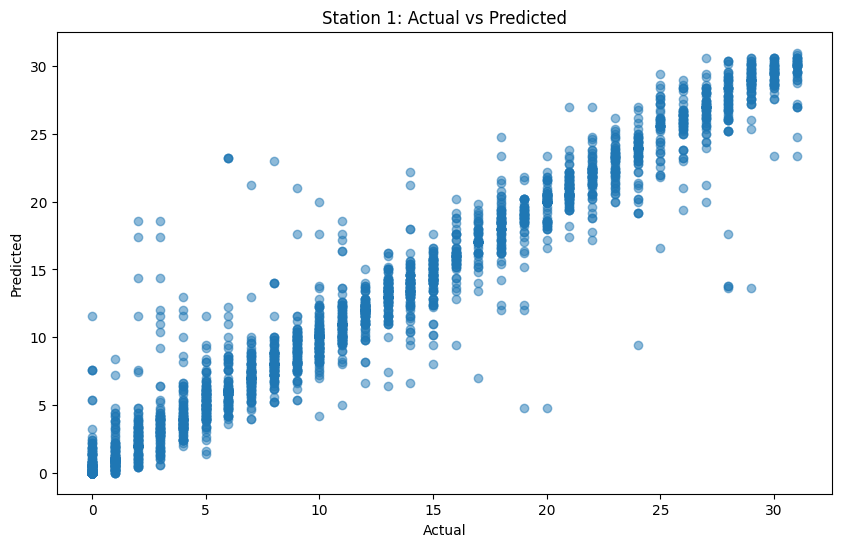

--------------------------------------------------
Number of predictions for station 2: 2780
R^2 Score: 0.9326336817601544
Accuracy: 0.5755395683453237


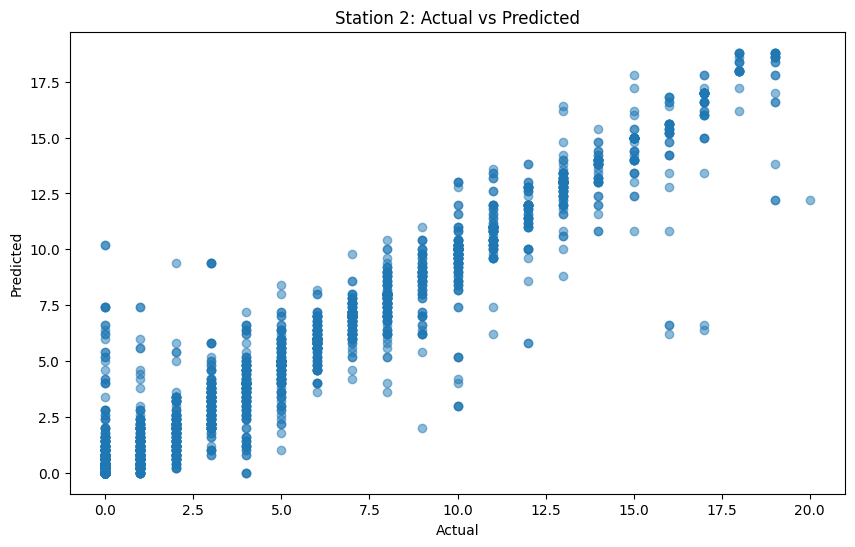

--------------------------------------------------
Number of predictions for station 3: 2963
R^2 Score: 0.9617344259664911
Accuracy: 0.5302058724265947


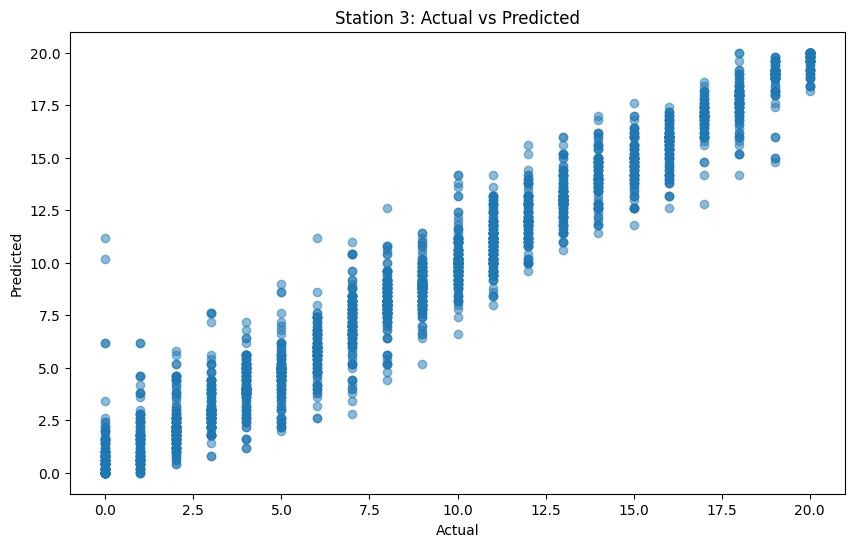

--------------------------------------------------
Number of predictions for station 4: 2821
R^2 Score: 0.9552539667194725
Accuracy: 0.6132577100319035


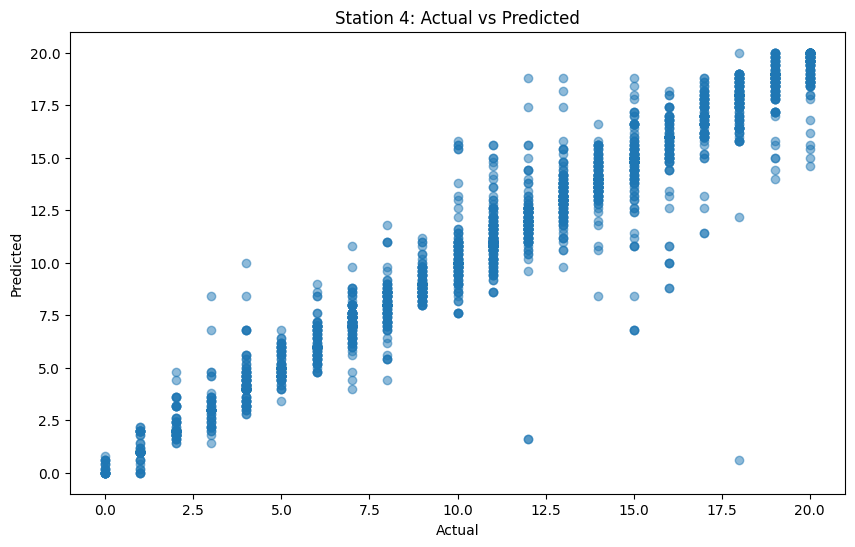

--------------------------------------------------
Number of predictions for station 5: 3362
R^2 Score: 0.945098238083702
Accuracy: 0.396192742415229


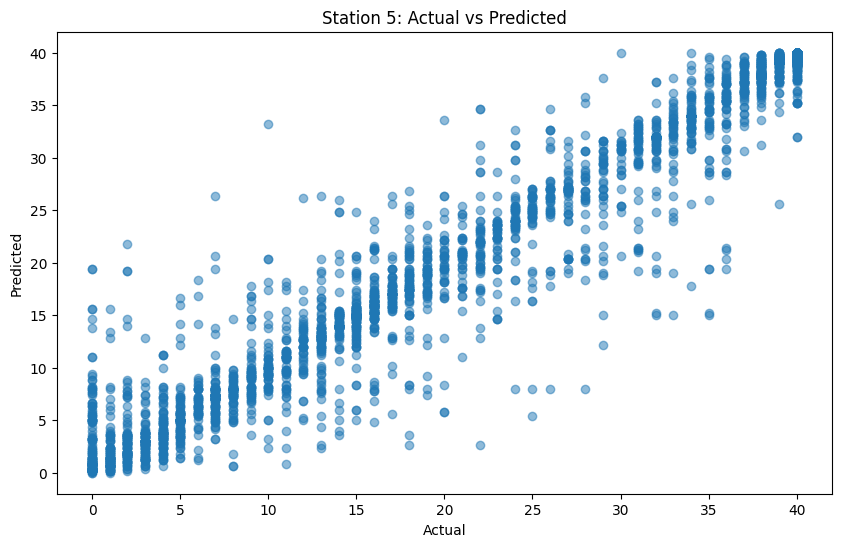

--------------------------------------------------
Number of predictions for station 6: 2862
R^2 Score: 0.9649387997109594
Accuracy: 0.5590496156533893


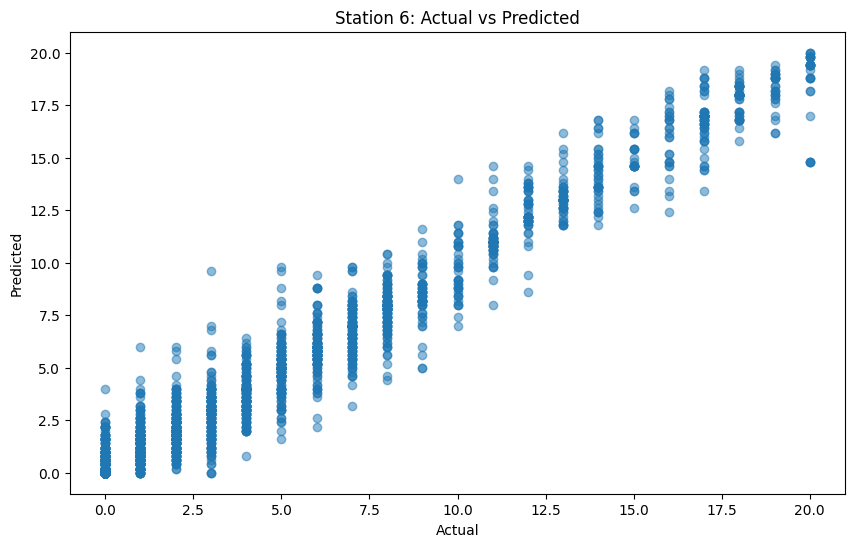

--------------------------------------------------
Number of predictions for station 7: 2767
R^2 Score: 0.9557994193196183
Accuracy: 0.6367907481026382


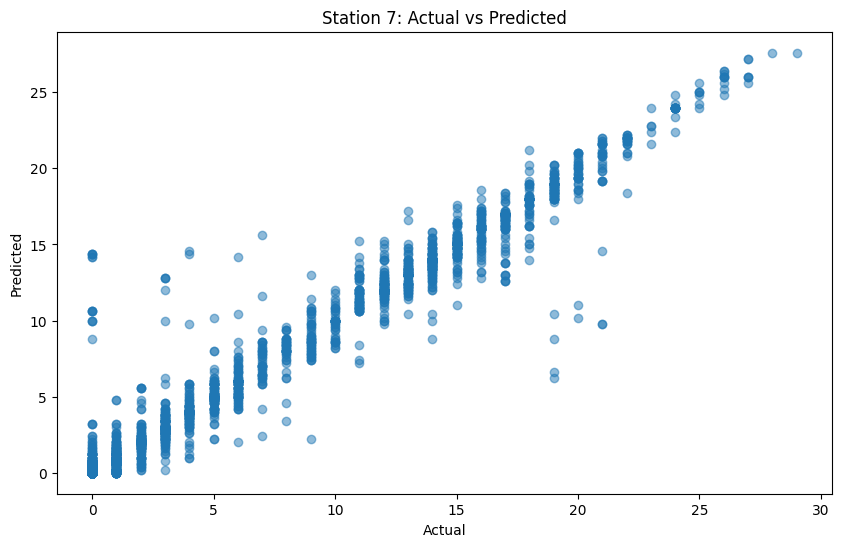

--------------------------------------------------
Number of predictions for station 8: 3187
R^2 Score: 0.9344977091249382
Accuracy: 0.4427361154690932


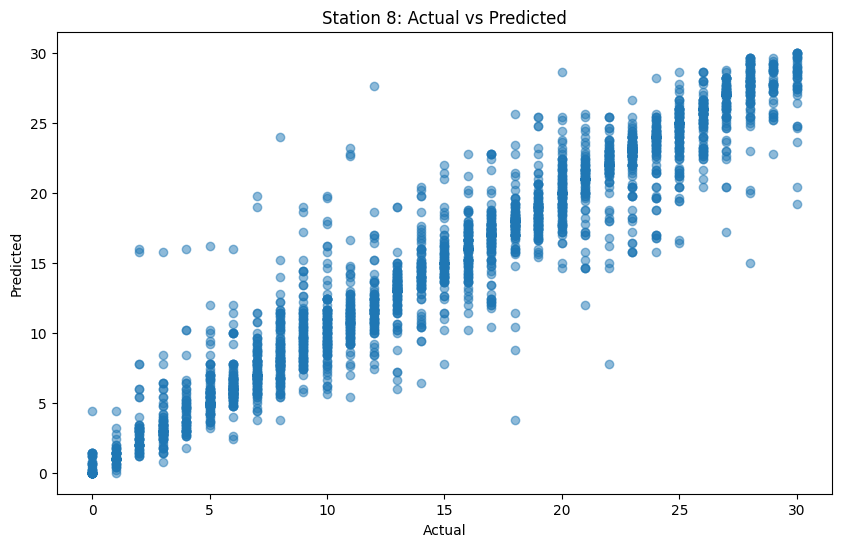

--------------------------------------------------
Number of predictions for station 9: 3327
R^2 Score: 0.9135799077035974
Accuracy: 0.4045686804929366


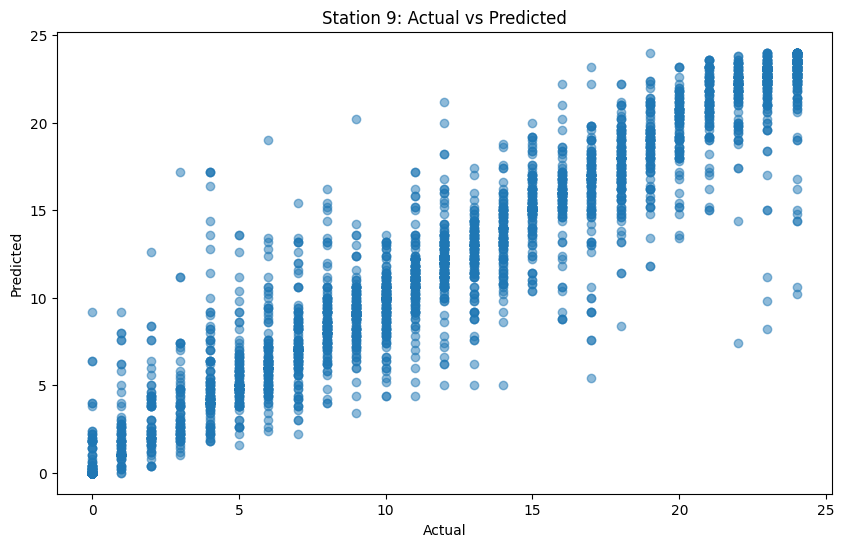

--------------------------------------------------
Number of predictions for station 10: 3056
R^2 Score: 0.9055083889404225
Accuracy: 0.5229057591623036


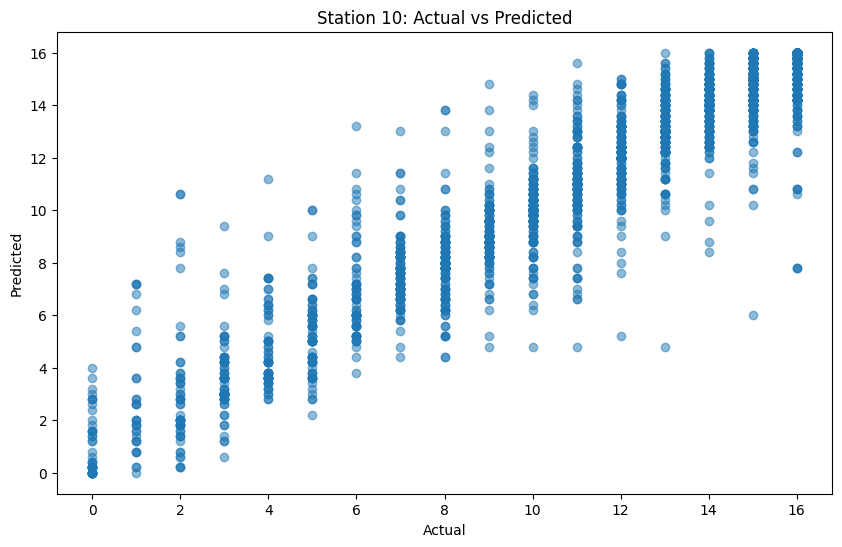

--------------------------------------------------
Number of predictions for station 11: 2706
R^2 Score: 0.9771181792692576
Accuracy: 0.6622320768662232


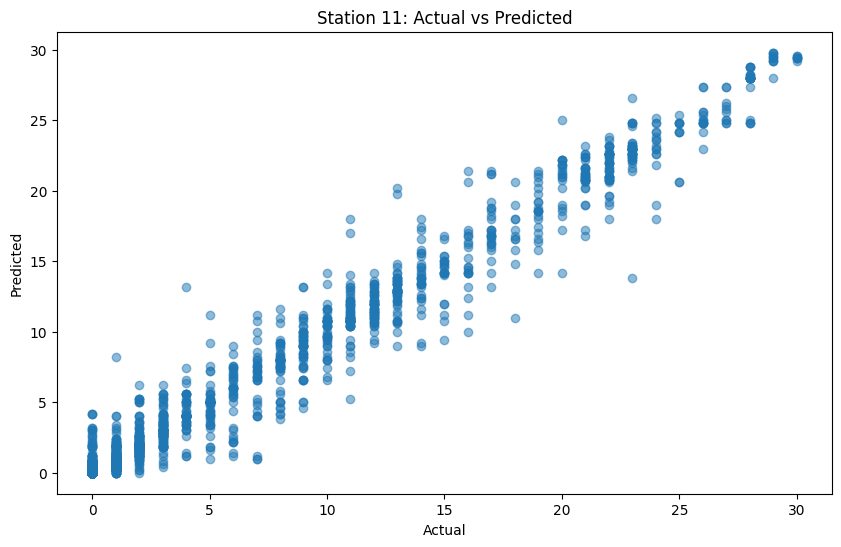

--------------------------------------------------
Number of predictions for station 12: 2748
R^2 Score: 0.9643773950770635
Accuracy: 0.6142649199417758


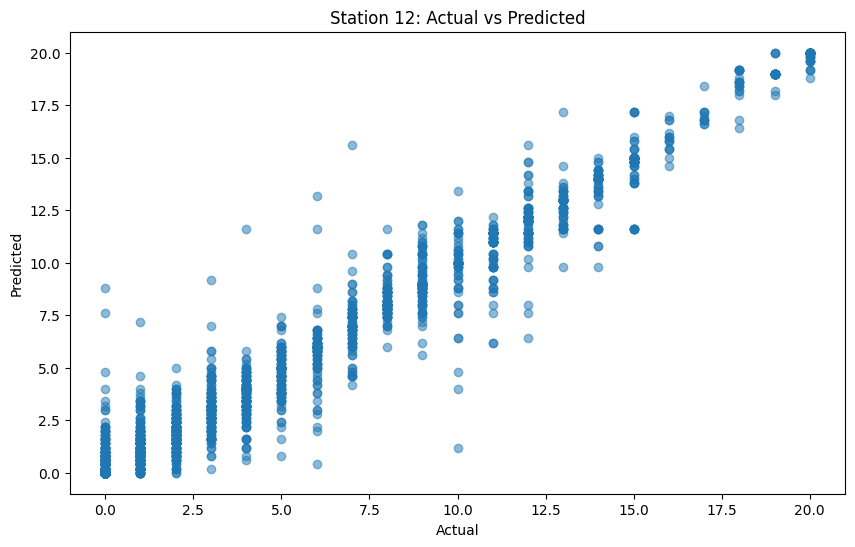

--------------------------------------------------
Number of predictions for station 13: 2712
R^2 Score: 0.9605135307632169
Accuracy: 0.6976401179941003


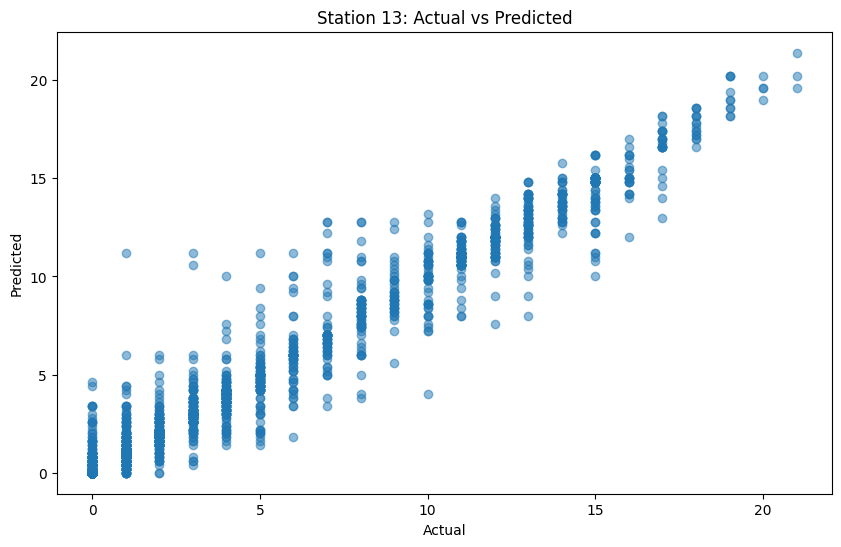

--------------------------------------------------
Number of predictions for station 14: 3201
R^2 Score: 0.9112965200517087
Accuracy: 0.4186191815057794


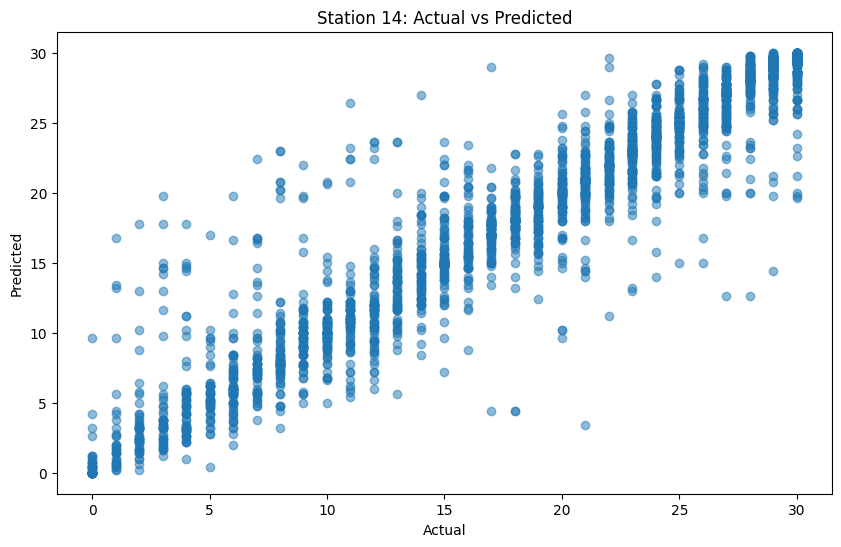

--------------------------------------------------
Number of predictions for station 15: 2807
R^2 Score: 0.9392470316761143
Accuracy: 0.600997506234414


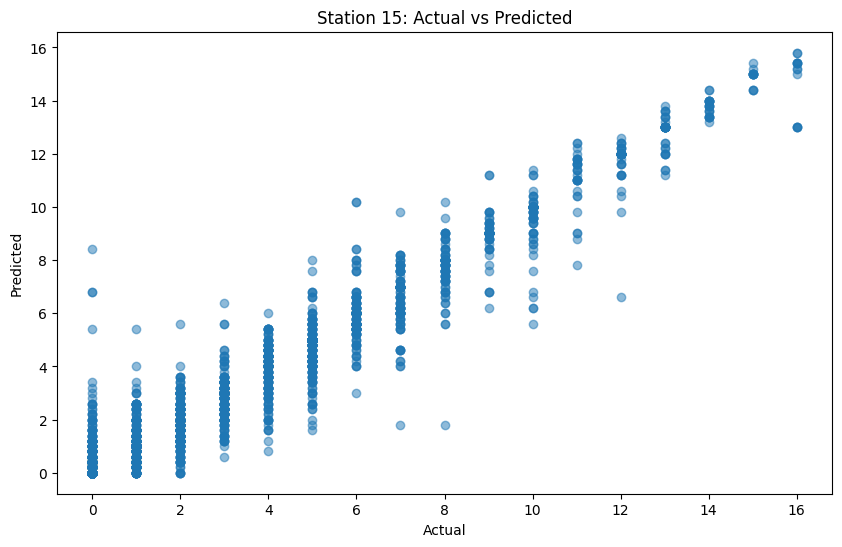

--------------------------------------------------
Number of predictions for station 16: 2887
R^2 Score: 0.9412097309942464
Accuracy: 0.5400069276065119


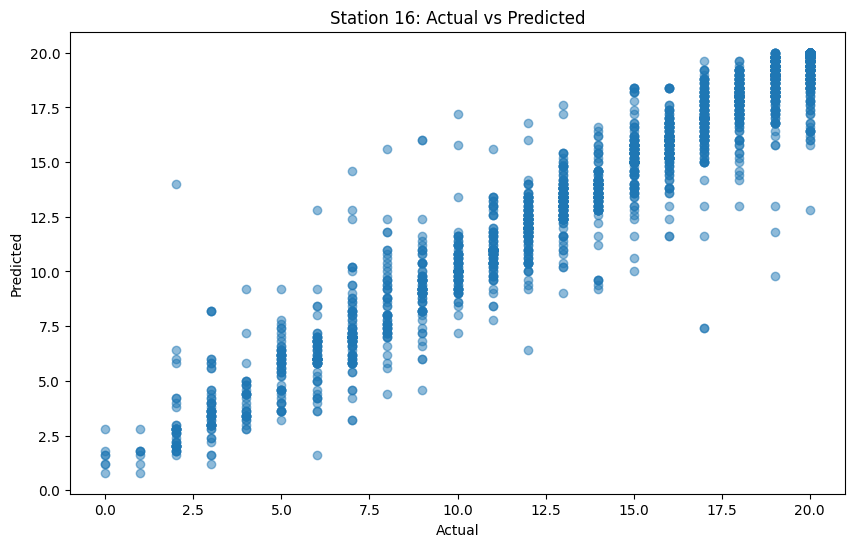

--------------------------------------------------
Number of predictions for station 17: 2760
R^2 Score: 0.9583722694428708
Accuracy: 0.643840579710145


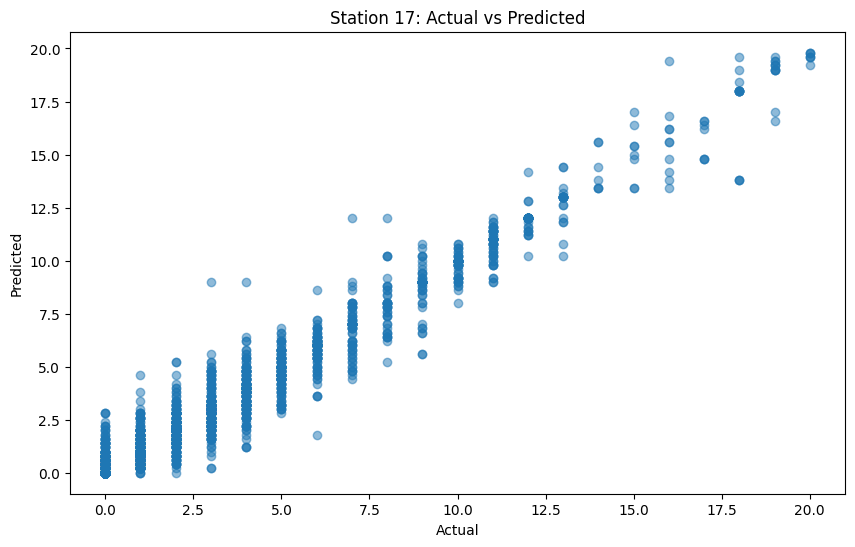

--------------------------------------------------
Number of predictions for station 18: 3193
R^2 Score: 0.9619534852039281
Accuracy: 0.43814594425305353


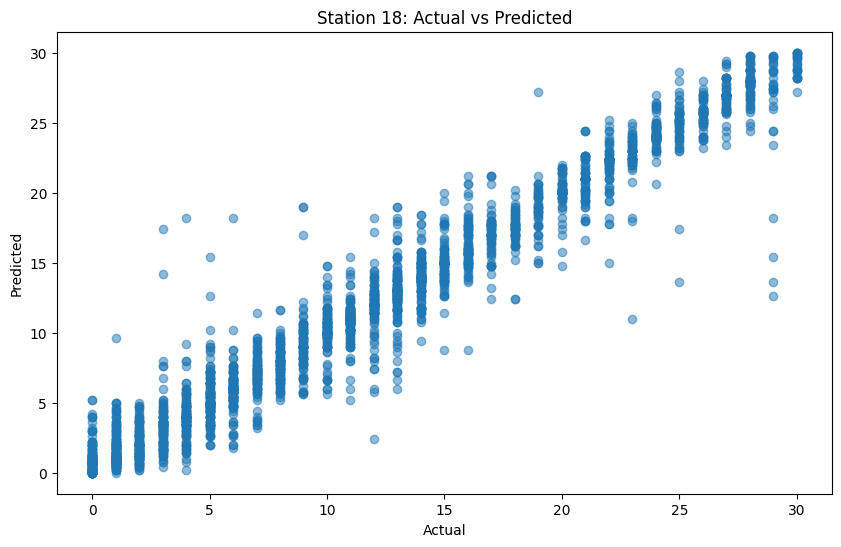

--------------------------------------------------
Number of predictions for station 19: 3280
R^2 Score: 0.9636874414196536
Accuracy: 0.4027439024390244


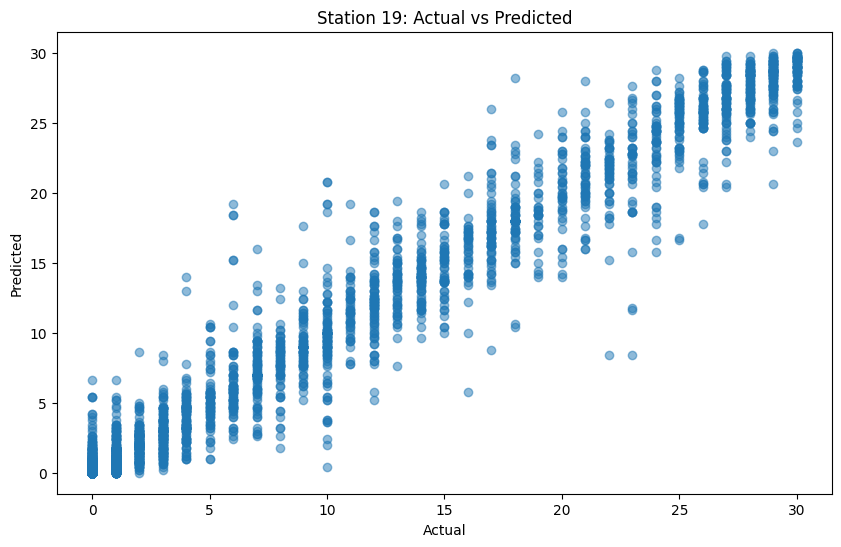

--------------------------------------------------
Number of predictions for station 20: 2873
R^2 Score: 0.9686852572903759
Accuracy: 0.5941524538809607


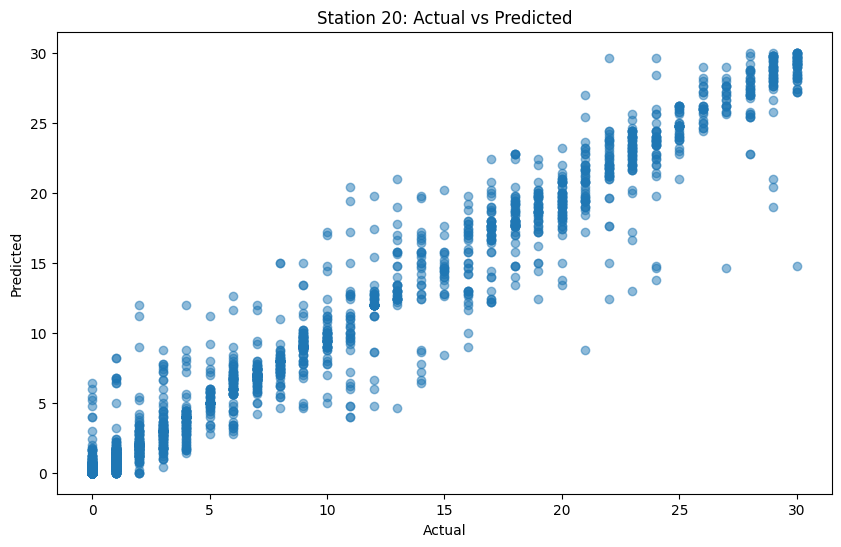

--------------------------------------------------
Number of predictions for station 21: 3074
R^2 Score: 0.9387722489328493
Accuracy: 0.45445673389720237


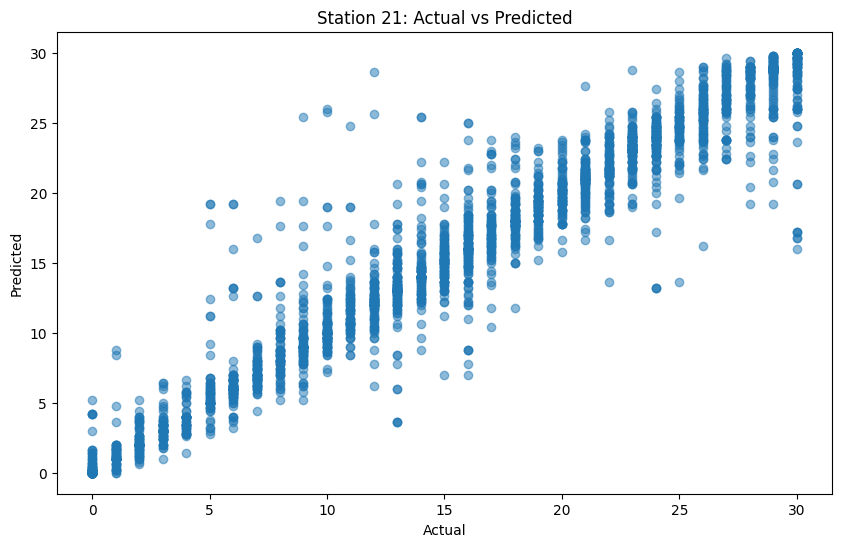

--------------------------------------------------
Number of predictions for station 22: 3103
R^2 Score: 0.945160395126769
Accuracy: 0.48662584595552694


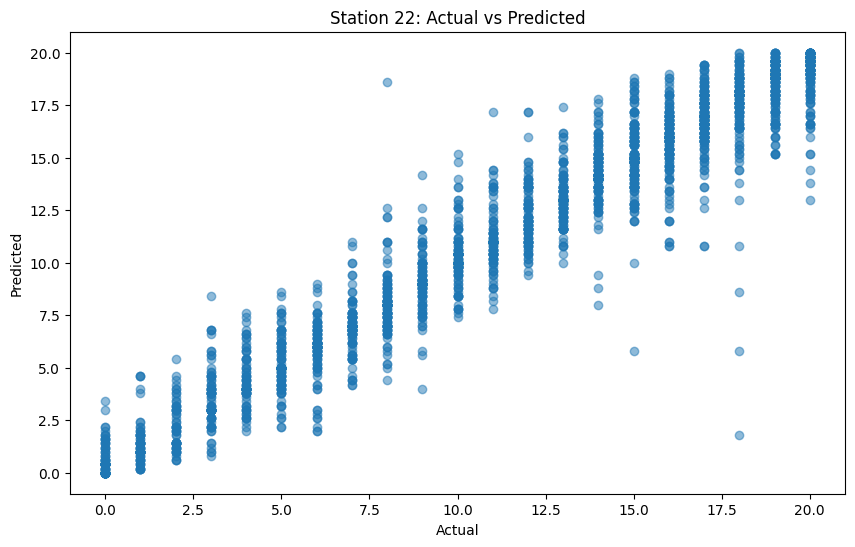

--------------------------------------------------
Number of predictions for station 23: 3114
R^2 Score: 0.934813344776467
Accuracy: 0.4775208734746307


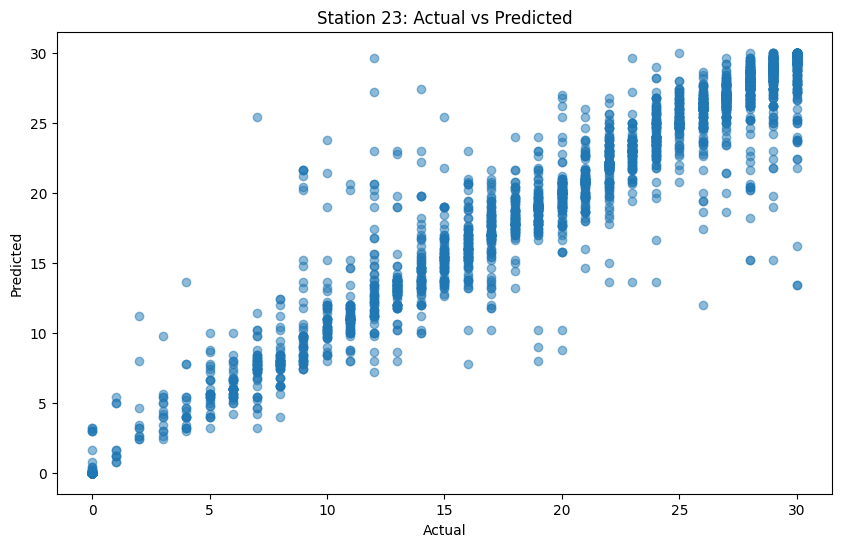

--------------------------------------------------
Number of predictions for station 24: 3231
R^2 Score: 0.9346143401288131
Accuracy: 0.4391829155060353


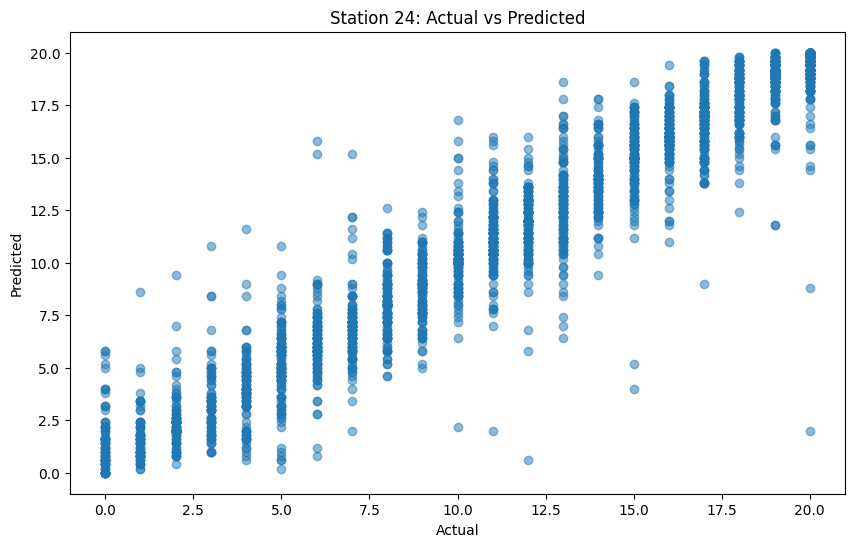

--------------------------------------------------
Number of predictions for station 25: 2826
R^2 Score: 0.978592497162921
Accuracy: 0.6454352441613588


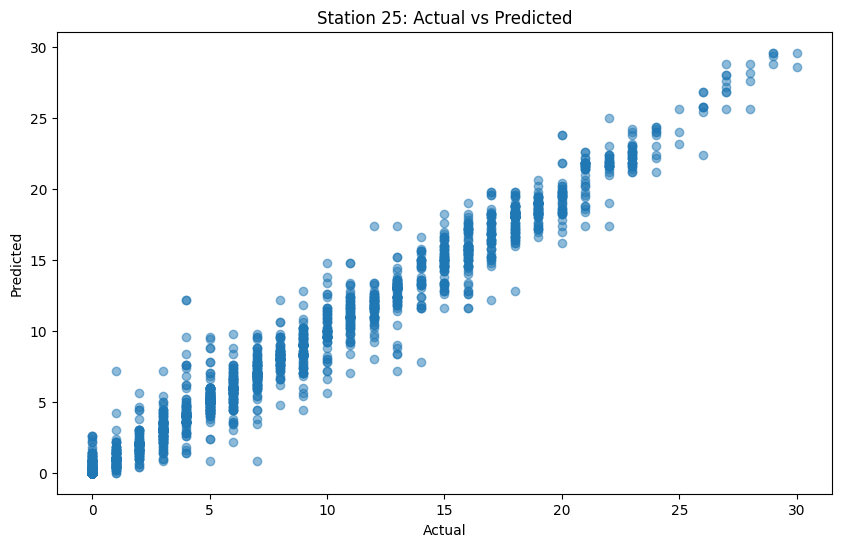

--------------------------------------------------
Number of predictions for station 26: 2891
R^2 Score: 0.9644246963656403
Accuracy: 0.5503286060186786


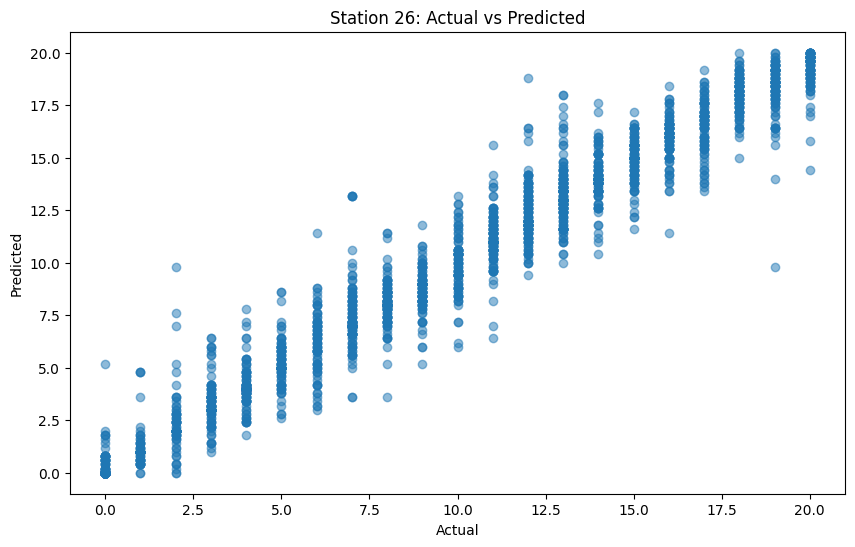

--------------------------------------------------
Number of predictions for station 27: 3020
R^2 Score: 0.9589833842365888
Accuracy: 0.4867549668874172


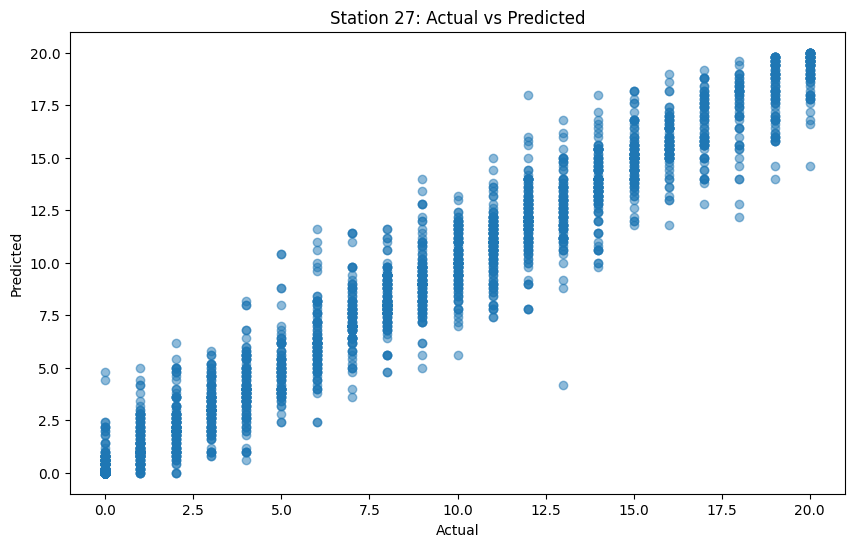

--------------------------------------------------
Number of predictions for station 28: 2962
R^2 Score: 0.847558839161374
Accuracy: 0.4726536124240378


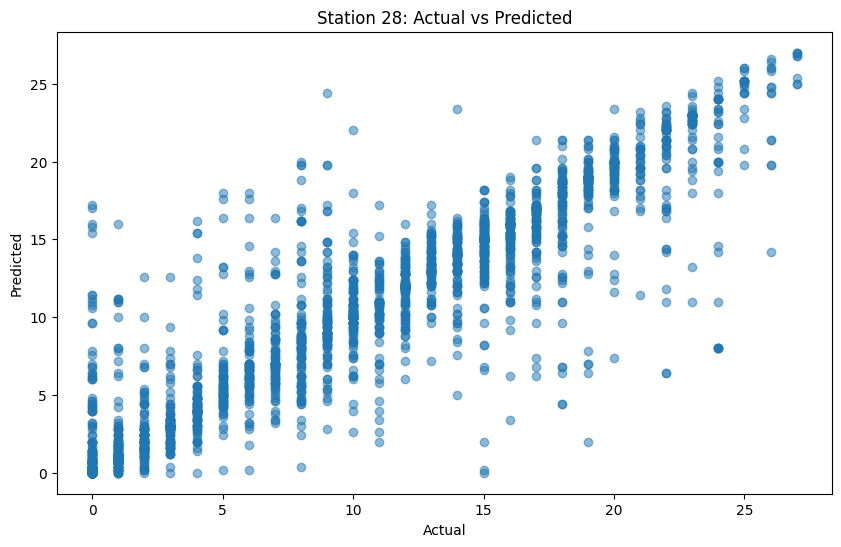

--------------------------------------------------
Number of predictions for station 29: 3181
R^2 Score: 0.9612199191871899
Accuracy: 0.456460232631248


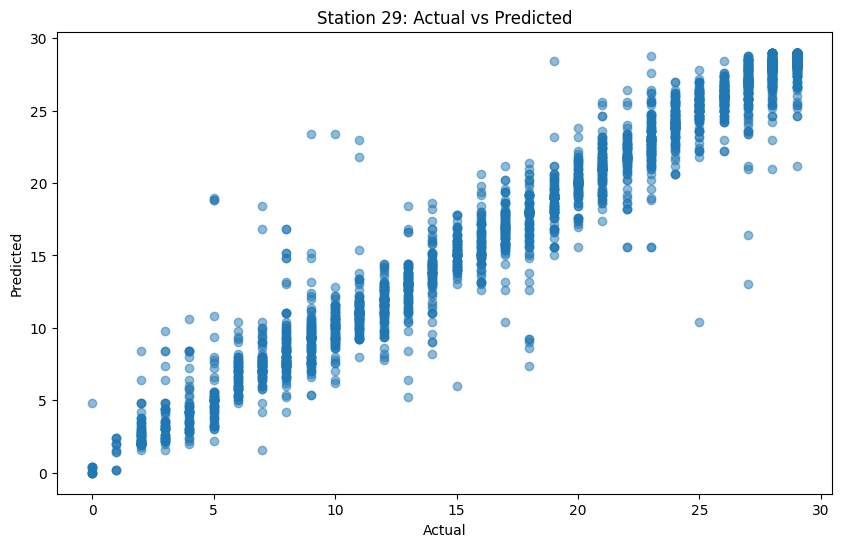

--------------------------------------------------
Number of predictions for station 30: 2696
R^2 Score: 0.9527612673182759
Accuracy: 0.7025222551928784


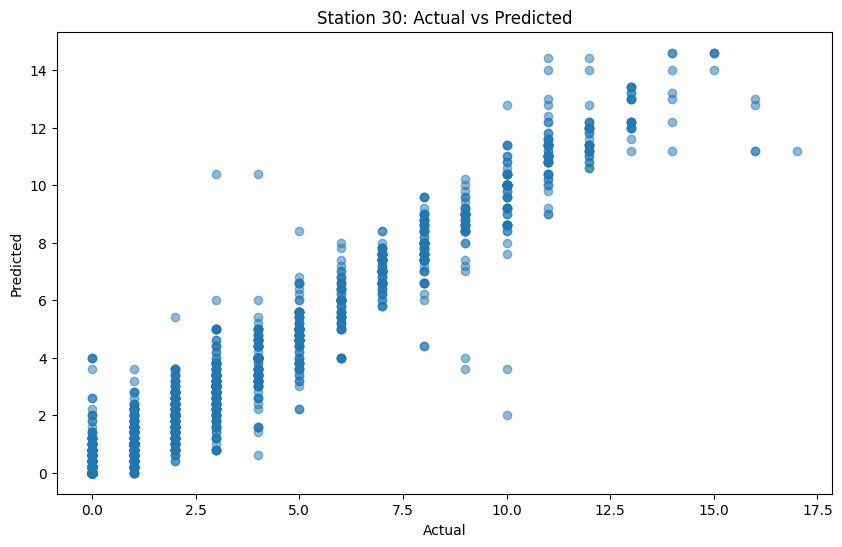

--------------------------------------------------
Number of predictions for station 31: 3117
R^2 Score: 0.9083943764211974
Accuracy: 0.465832531280077


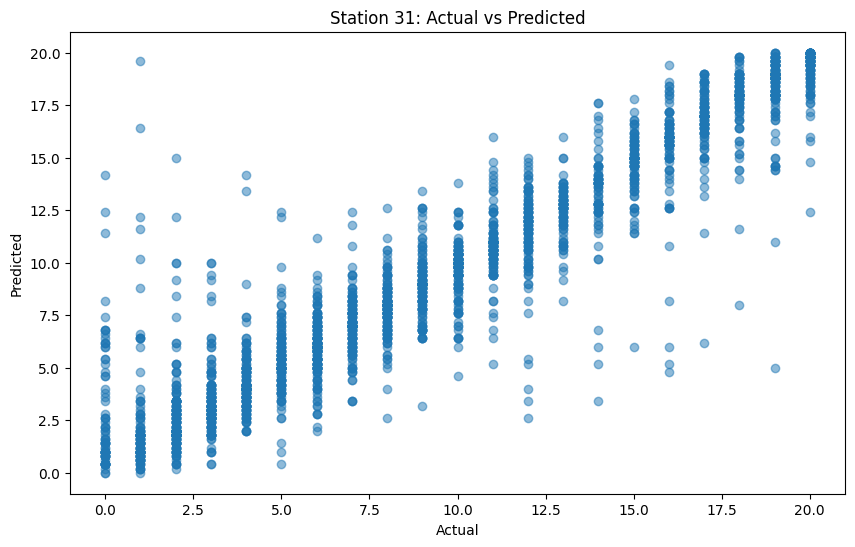

--------------------------------------------------
Number of predictions for station 32: 3214
R^2 Score: 0.9332551977525413
Accuracy: 0.4309271935283136


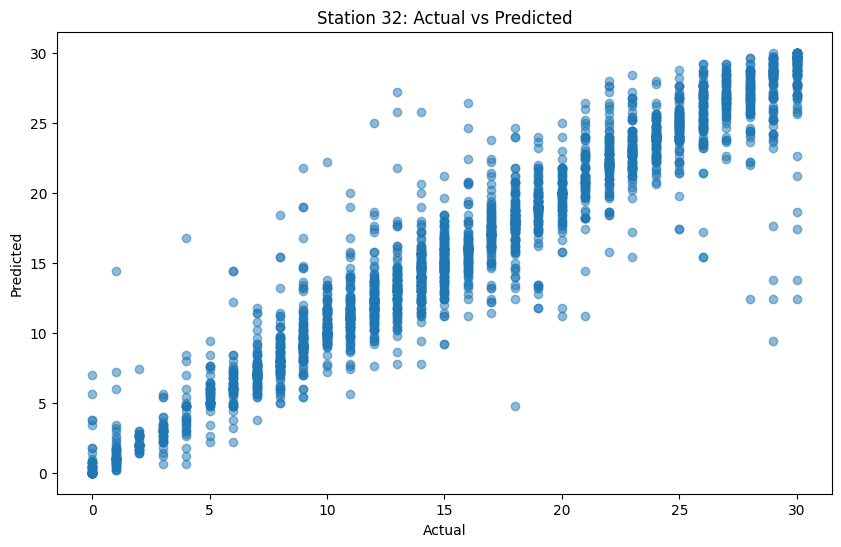

--------------------------------------------------
Number of predictions for station 33: 3429
R^2 Score: 0.7960658314672646
Accuracy: 0.3689122193059201


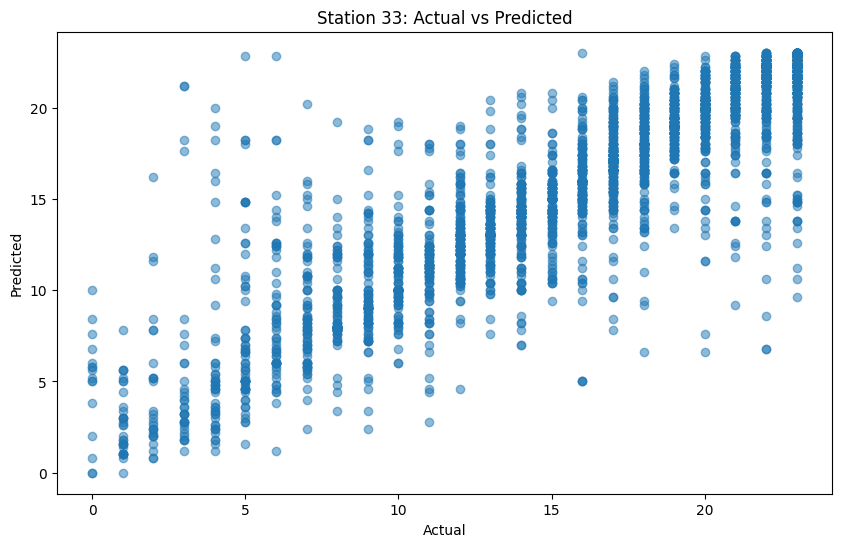

--------------------------------------------------
Number of predictions for station 34: 3312
R^2 Score: 0.9184944523939815
Accuracy: 0.3710748792270531


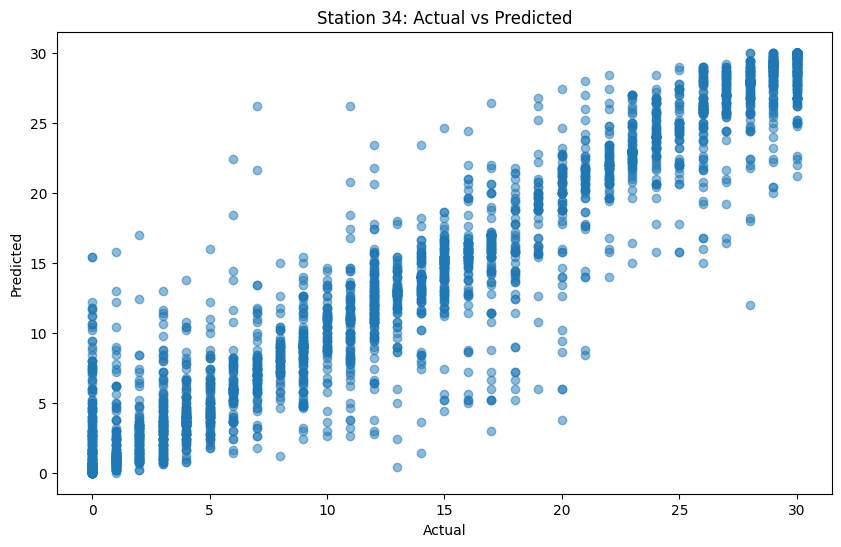

--------------------------------------------------
Number of predictions for station 35: 3182
R^2 Score: 0.9816585333313284
Accuracy: 0.46951602765556255


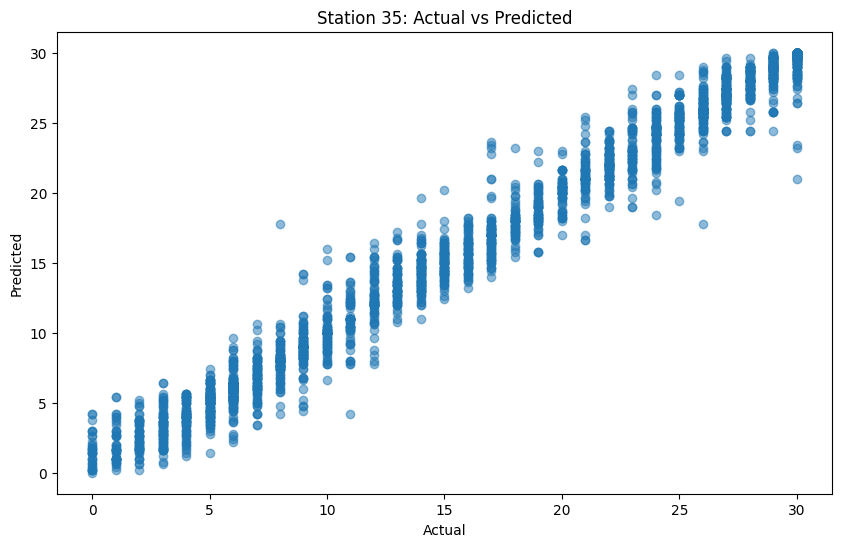

--------------------------------------------------
Number of predictions for station 36: 2940
R^2 Score: 0.9708218483218866
Accuracy: 0.5724489795918367


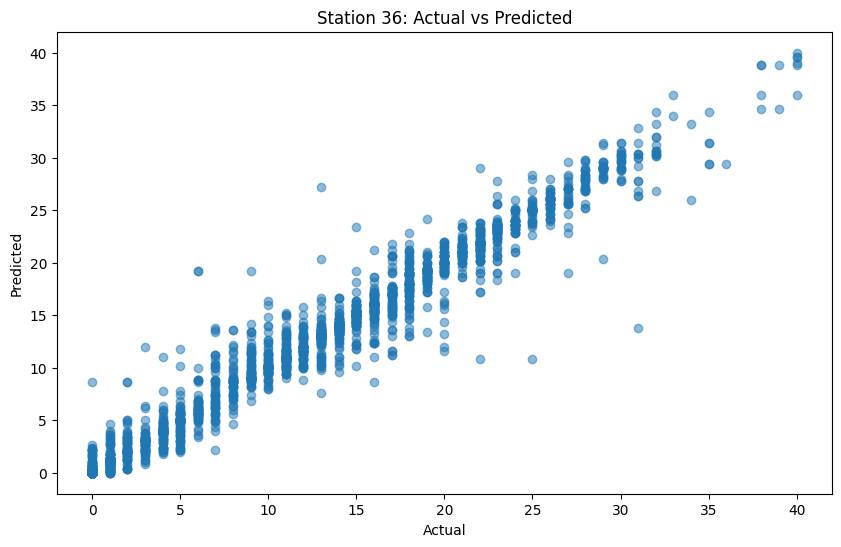

--------------------------------------------------
Number of predictions for station 37: 2628
R^2 Score: 0.9804660440899357
Accuracy: 0.7359208523592086


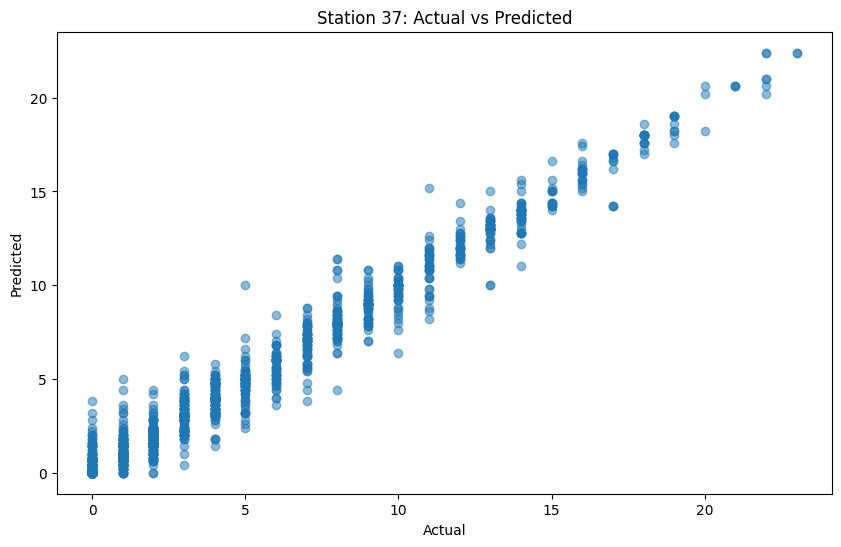

--------------------------------------------------
Number of predictions for station 38: 3304
R^2 Score: 0.9756393055273705
Accuracy: 0.463680387409201


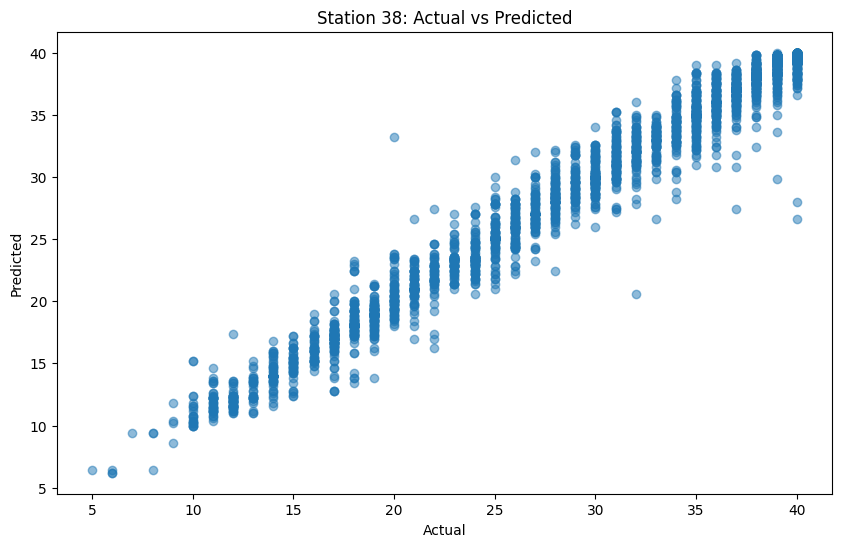

--------------------------------------------------
Number of predictions for station 39: 3206
R^2 Score: 0.8969871290020817
Accuracy: 0.466313162819713


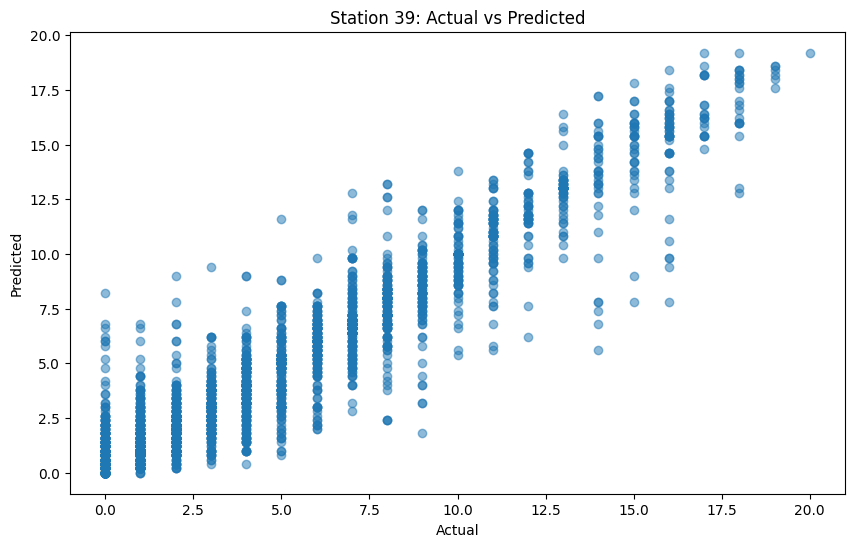

--------------------------------------------------
Number of predictions for station 40: 3111
R^2 Score: 0.9357385646296852
Accuracy: 0.4831243972999036


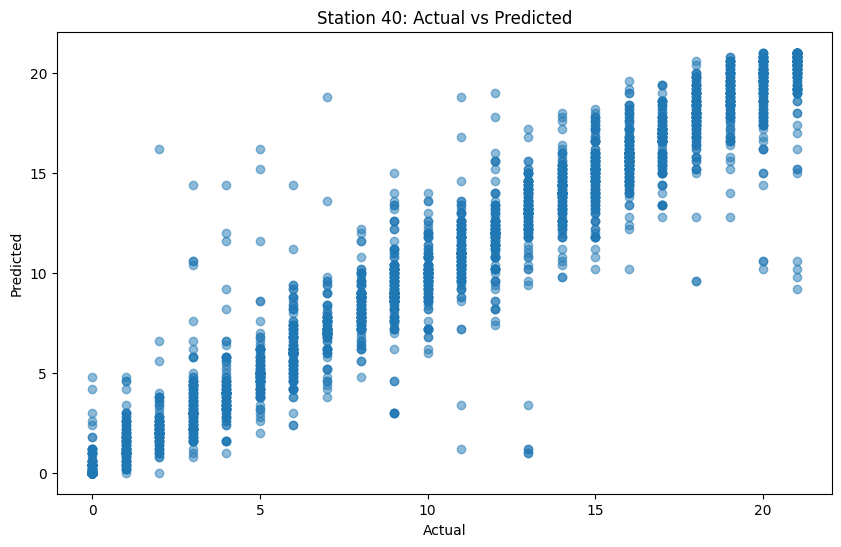

--------------------------------------------------
Number of predictions for station 41: 2754
R^2 Score: 0.9440683429231966
Accuracy: 0.6437908496732027


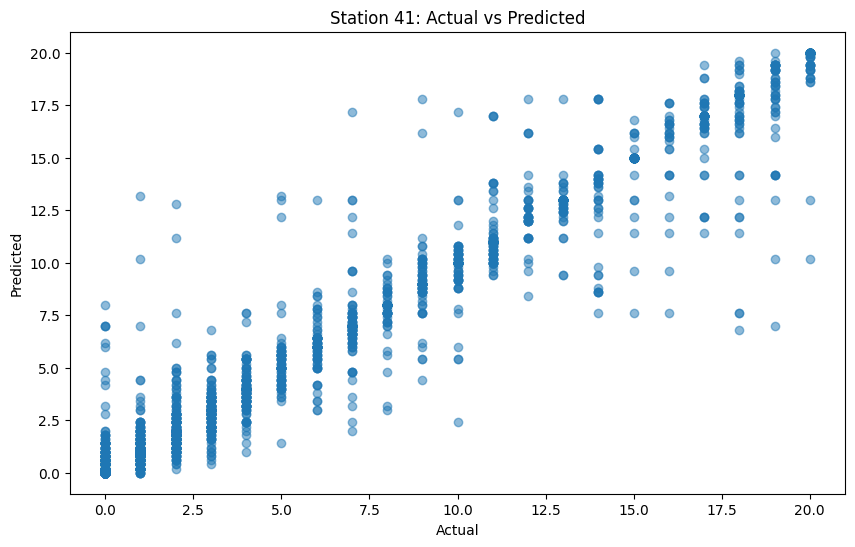

--------------------------------------------------
Number of predictions for station 42: 3067
R^2 Score: 0.9763131291535285
Accuracy: 0.48092598630583633


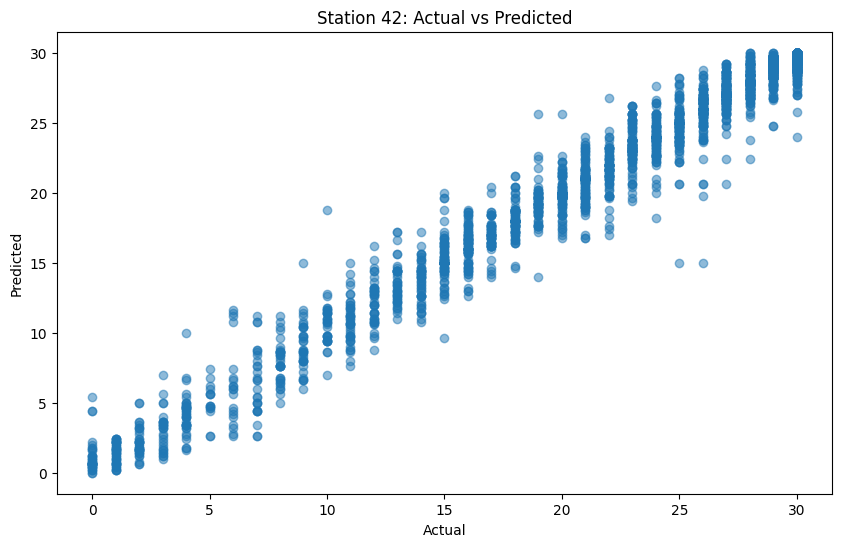

--------------------------------------------------
Number of predictions for station 43: 3019
R^2 Score: 0.9509821539177323
Accuracy: 0.4845975488572375


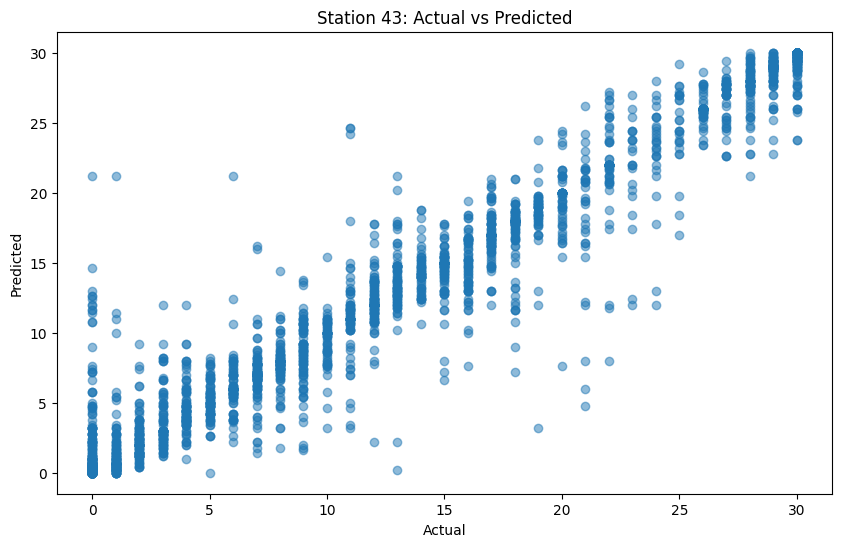

--------------------------------------------------
Number of predictions for station 44: 2933
R^2 Score: 0.9701468330881005
Accuracy: 0.5192635526764405


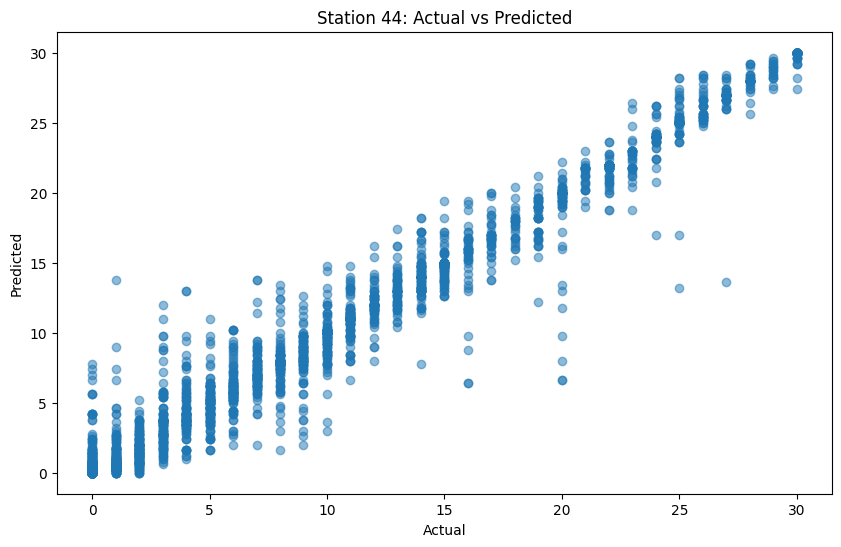

--------------------------------------------------
Number of predictions for station 45: 2936
R^2 Score: 0.9706502446091817
Accuracy: 0.571866485013624


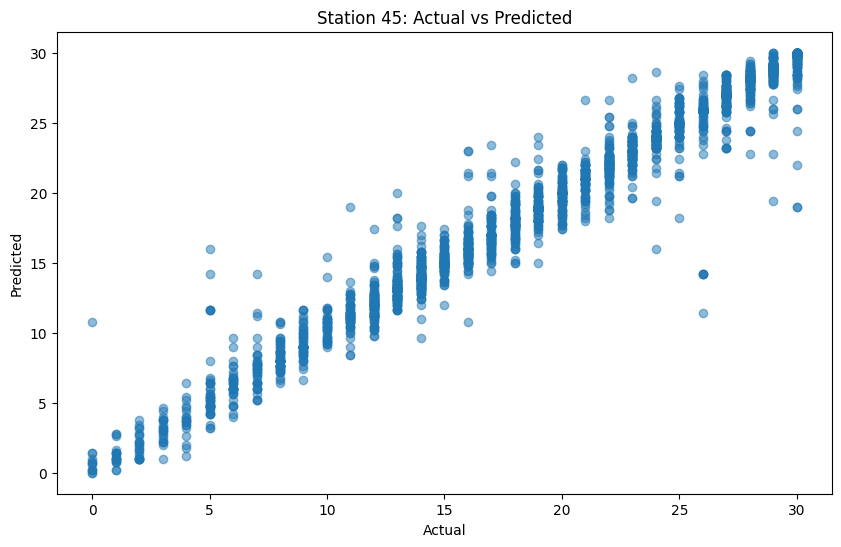

--------------------------------------------------
Number of predictions for station 47: 2735
R^2 Score: 0.9704946225973968
Accuracy: 0.683363802559415


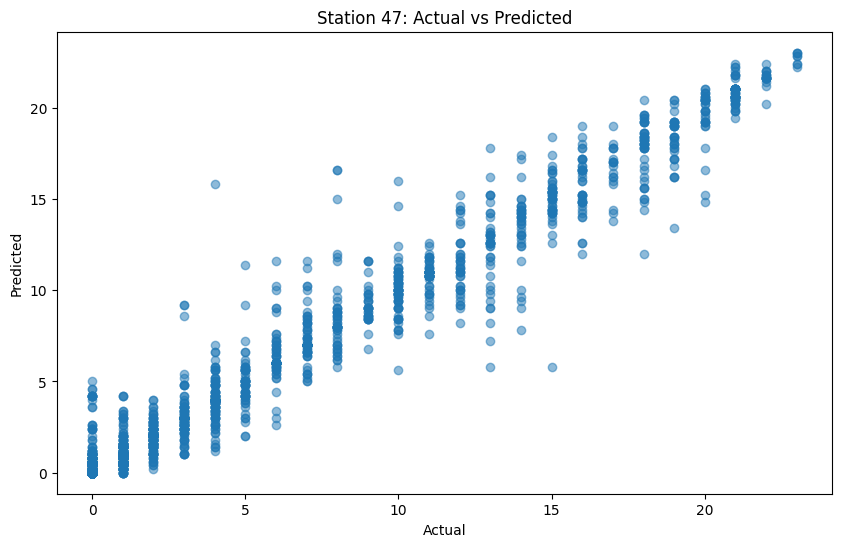

--------------------------------------------------
Number of predictions for station 48: 2982
R^2 Score: 0.9816653780181809
Accuracy: 0.5358819584171697


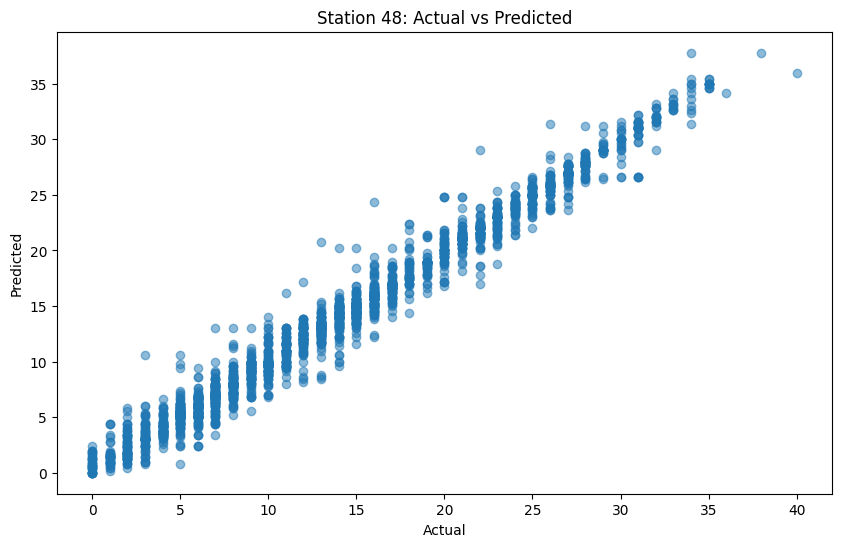

--------------------------------------------------
Number of predictions for station 49: 3239
R^2 Score: 0.9739155046364555
Accuracy: 0.42451373880827414


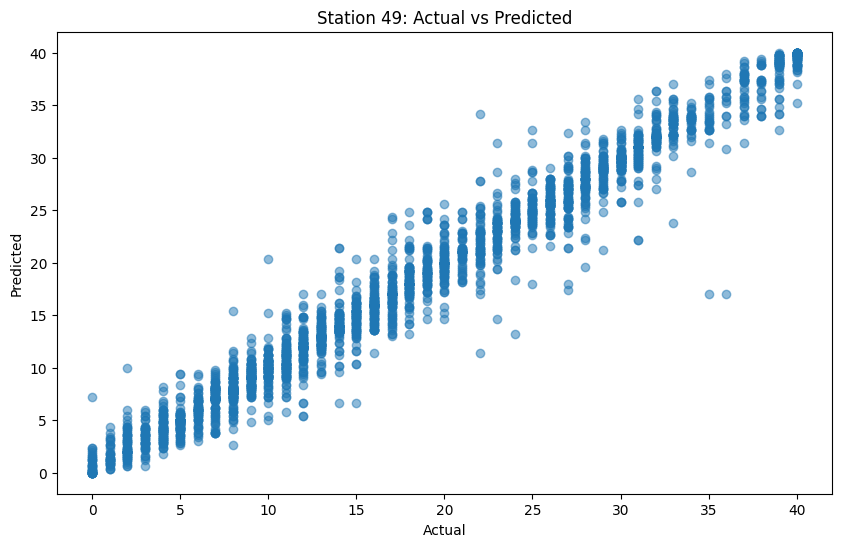

--------------------------------------------------
Number of predictions for station 50: 3179
R^2 Score: 0.9794913266384406
Accuracy: 0.44510852469329976


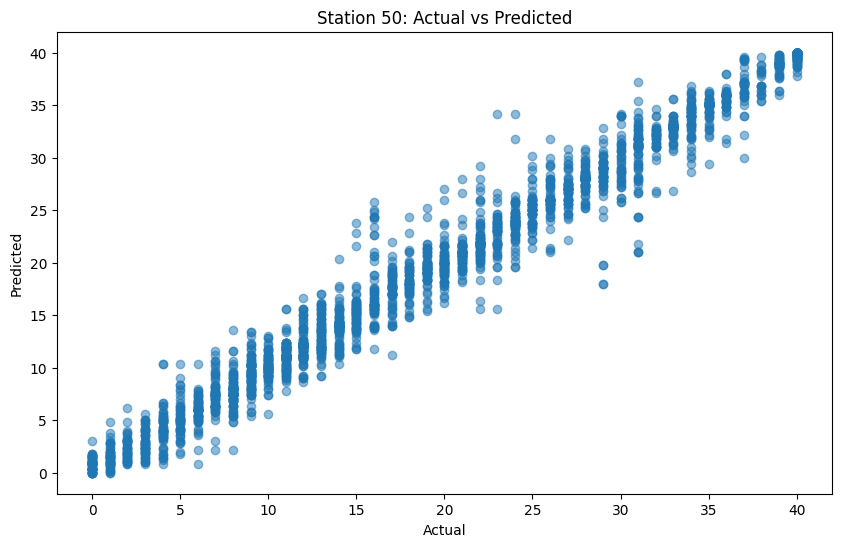

--------------------------------------------------
Number of predictions for station 51: 2737
R^2 Score: 0.9781655297682872
Accuracy: 0.6740957252466204


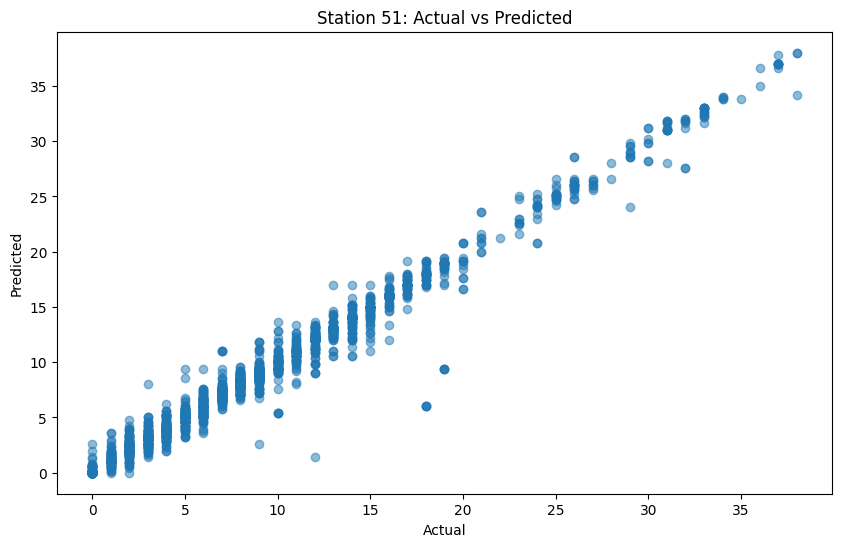

--------------------------------------------------
Number of predictions for station 52: 2774
R^2 Score: 0.9760647300966463
Accuracy: 0.5681326604181687


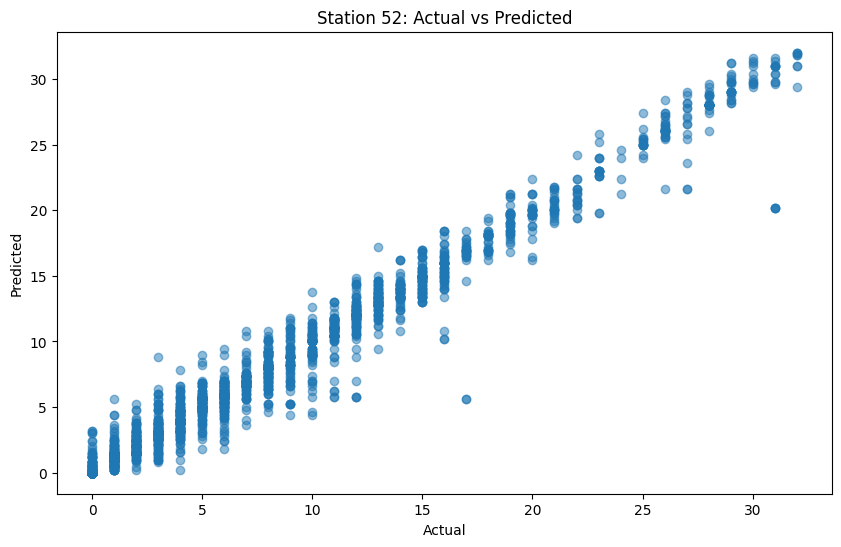

--------------------------------------------------
Number of predictions for station 53: 2640
R^2 Score: 0.9714833265989271
Accuracy: 0.7643939393939394


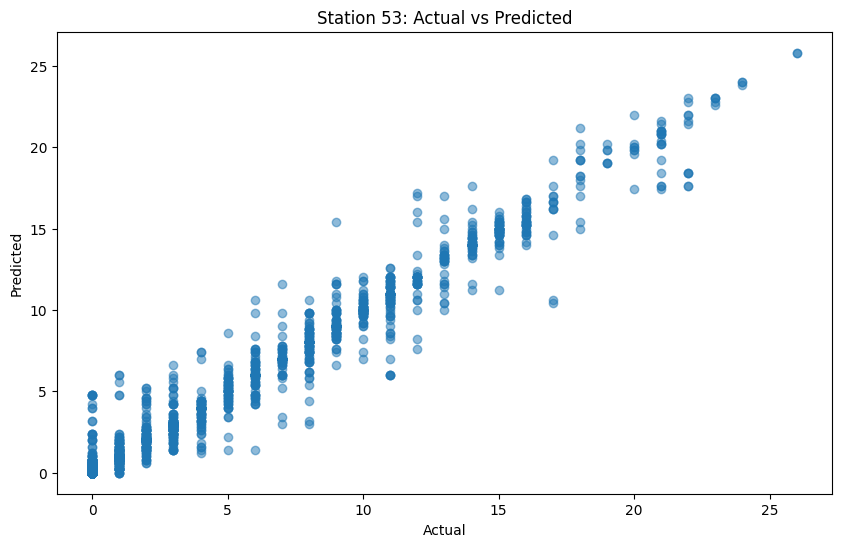

--------------------------------------------------
Number of predictions for station 54: 2804
R^2 Score: 0.9812176053652576
Accuracy: 0.6151925820256776


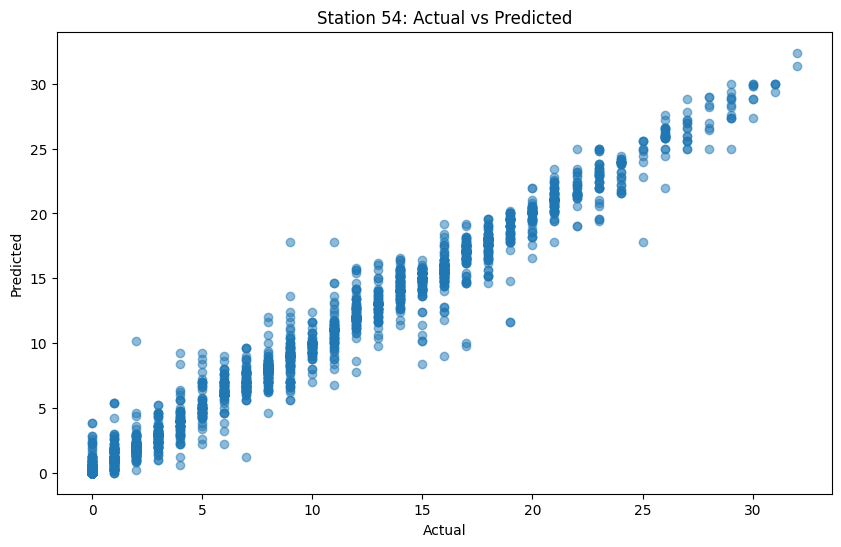

--------------------------------------------------
Number of predictions for station 55: 2777
R^2 Score: 0.9772437662652966
Accuracy: 0.6640259272596327


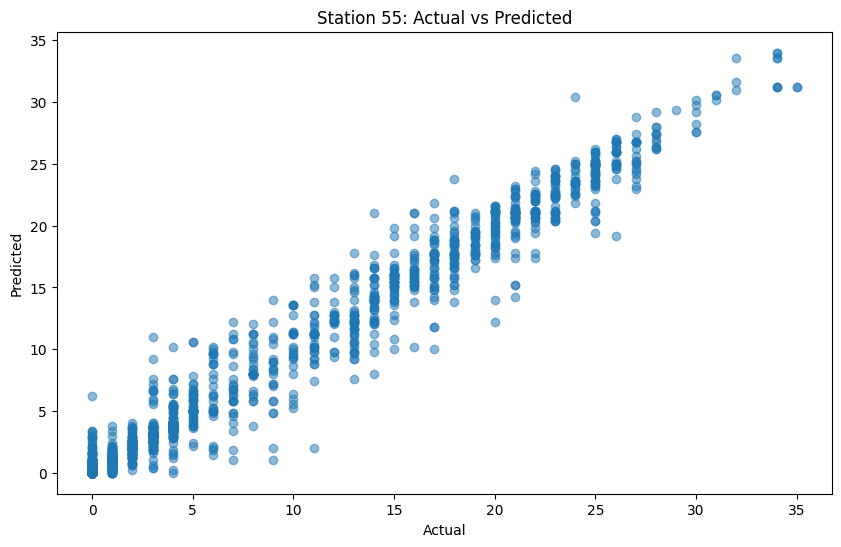

--------------------------------------------------
Number of predictions for station 56: 3127
R^2 Score: 0.9647032530203419
Accuracy: 0.43971858010873044


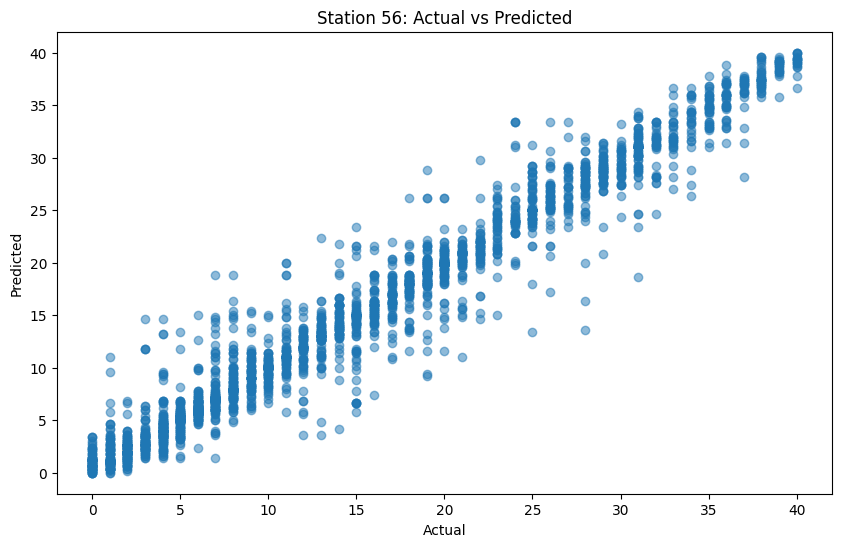

--------------------------------------------------
Number of predictions for station 57: 2753
R^2 Score: 0.9692261677543069
Accuracy: 0.6382128586996004


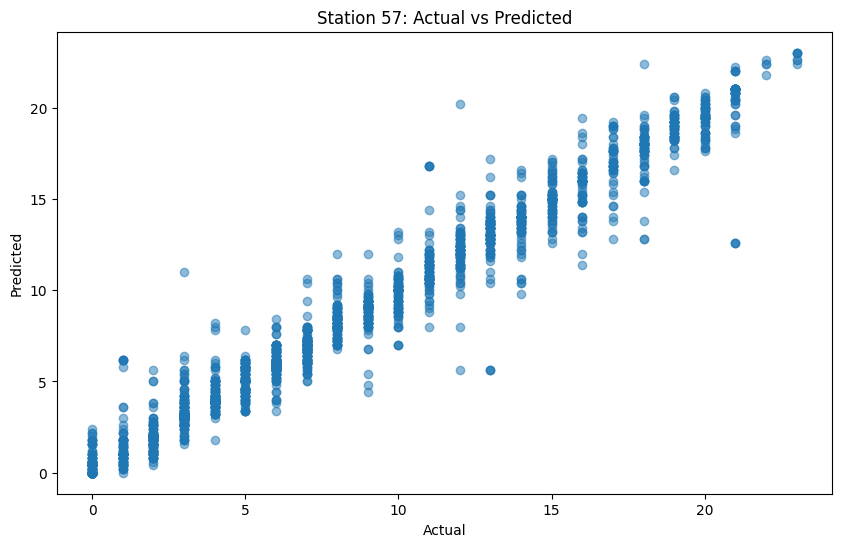

--------------------------------------------------
Number of predictions for station 58: 3310
R^2 Score: 0.9553360409272994
Accuracy: 0.3833836858006042


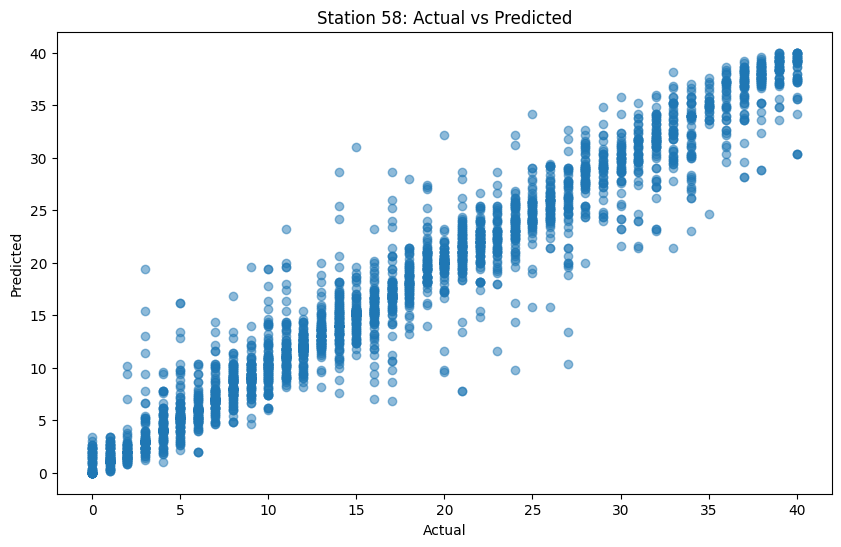

--------------------------------------------------
Number of predictions for station 59: 2778
R^2 Score: 0.9436488174011864
Accuracy: 0.6439884809215263


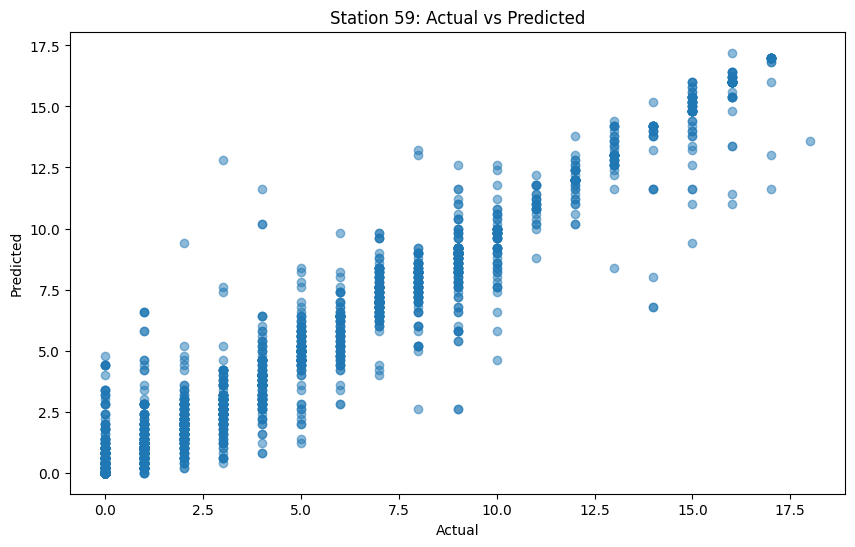

--------------------------------------------------
Number of predictions for station 60: 3180
R^2 Score: 0.9547452269013147
Accuracy: 0.4169811320754717


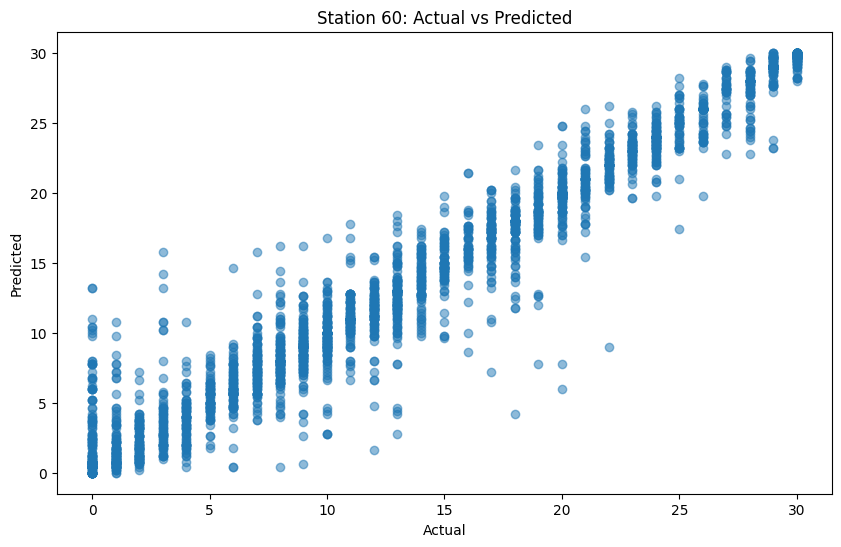

--------------------------------------------------
Number of predictions for station 61: 2670
R^2 Score: 0.9629833338544426
Accuracy: 0.702247191011236


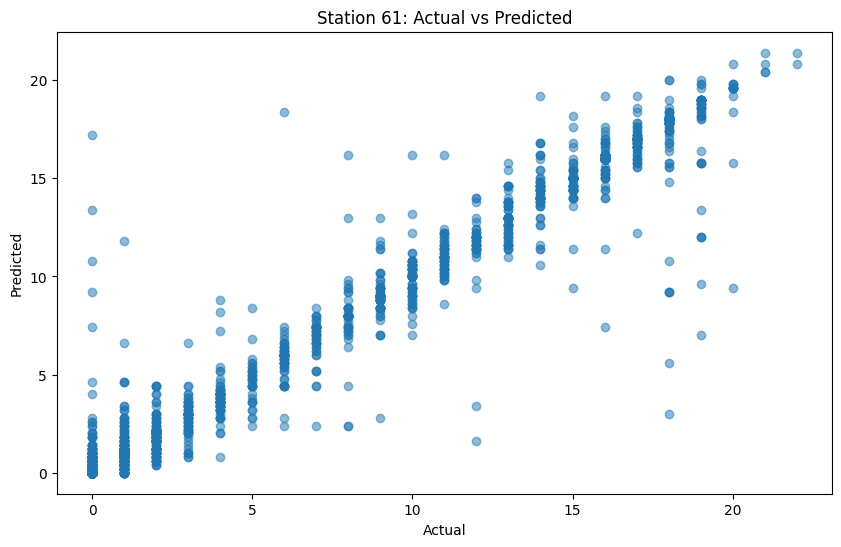

--------------------------------------------------
Number of predictions for station 62: 3024
R^2 Score: 0.9785915686745704
Accuracy: 0.5052910052910053


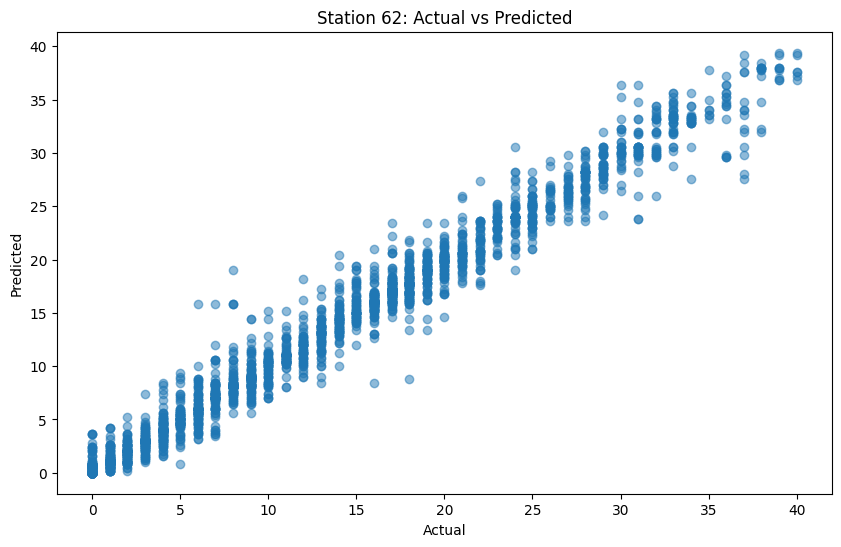

--------------------------------------------------
Number of predictions for station 63: 2923
R^2 Score: 0.9690326773688053
Accuracy: 0.572699281560041


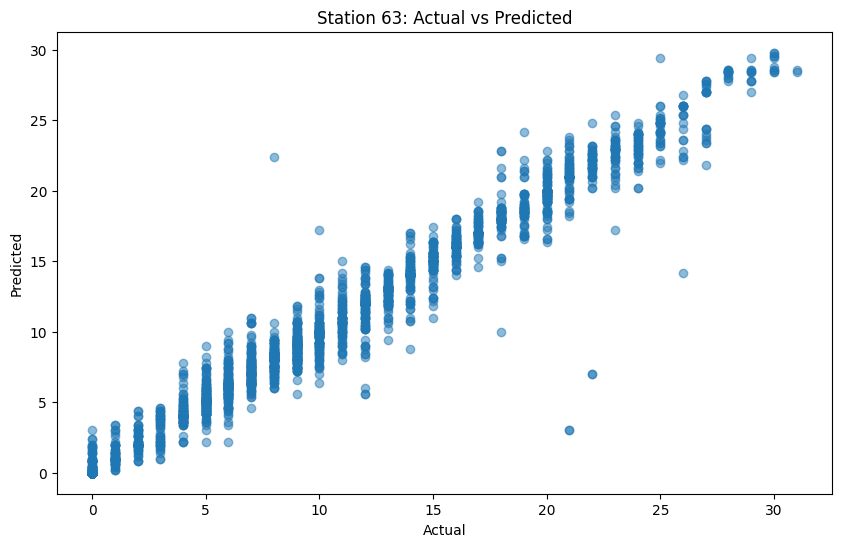

--------------------------------------------------
Number of predictions for station 64: 3125
R^2 Score: 0.9456054717558768
Accuracy: 0.49696


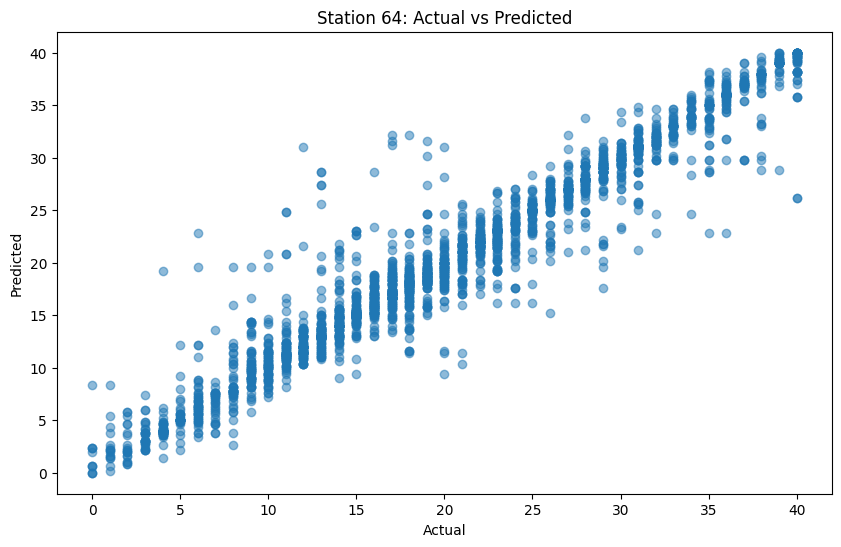

--------------------------------------------------
Number of predictions for station 65: 2709
R^2 Score: 0.9482795991297812
Accuracy: 0.5112587670727206


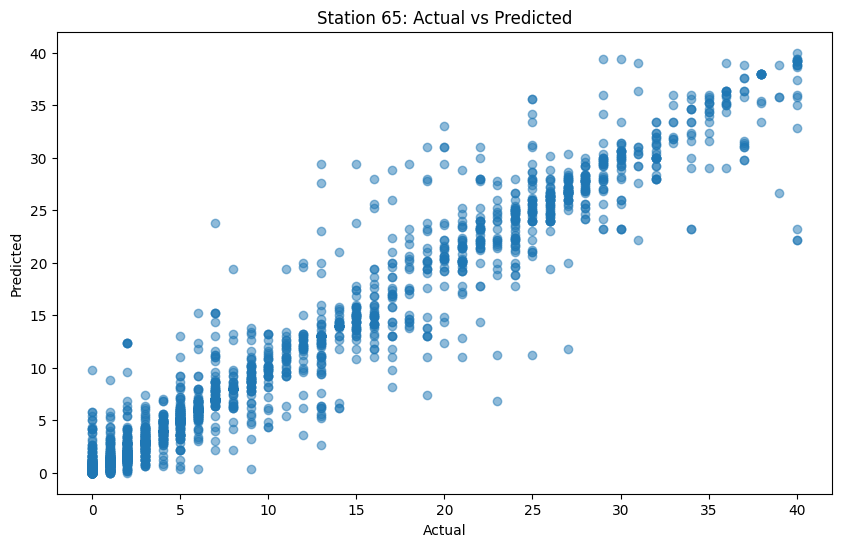

--------------------------------------------------
Number of predictions for station 66: 3033
R^2 Score: 0.9479339939264044
Accuracy: 0.4045499505440158


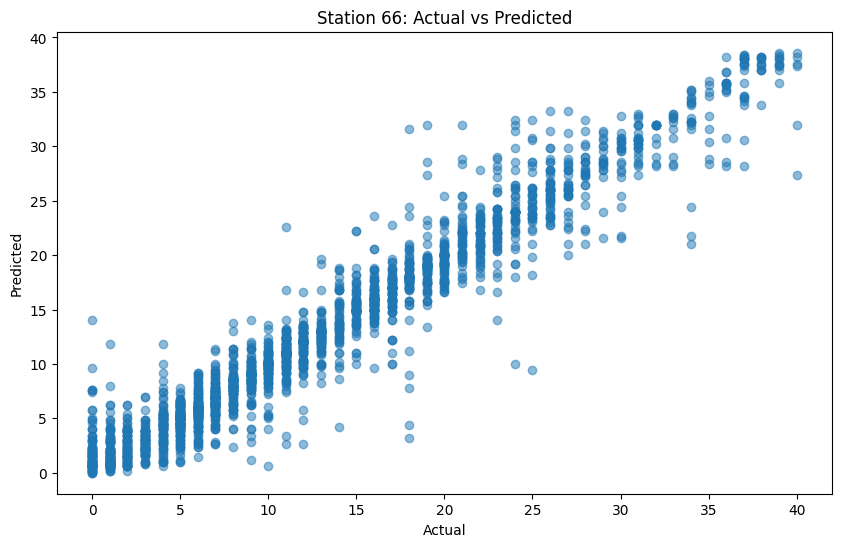

--------------------------------------------------
Number of predictions for station 67: 3229
R^2 Score: 0.9666135502852465
Accuracy: 0.4187054815732425


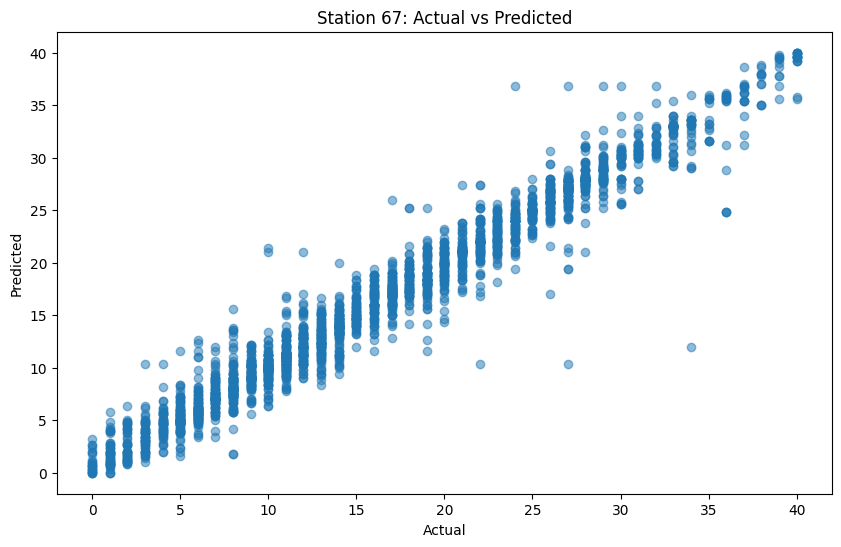

--------------------------------------------------
Number of predictions for station 68: 3227
R^2 Score: 0.9654294217220112
Accuracy: 0.41927486829872945


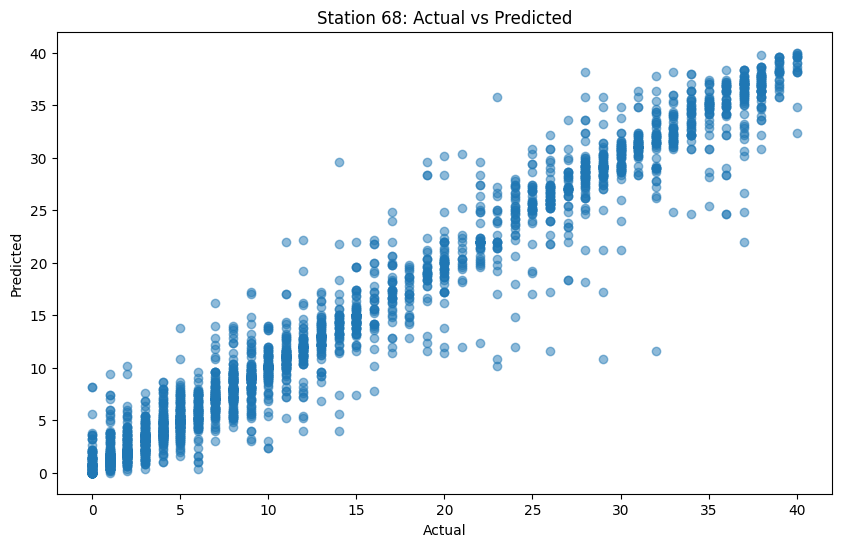

--------------------------------------------------
Number of predictions for station 69: 3573
R^2 Score: 0.9612413198429259
Accuracy: 0.3420095158130423


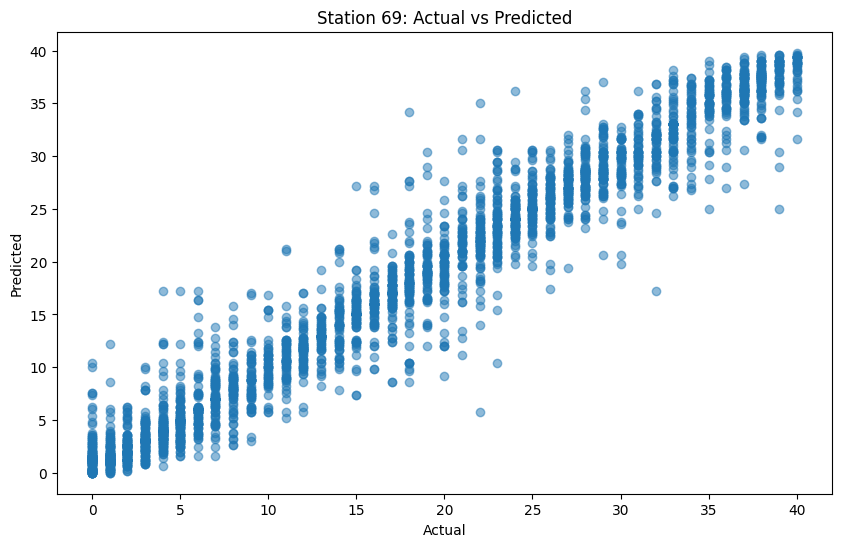

--------------------------------------------------
Number of predictions for station 71: 2902
R^2 Score: 0.9662942954238687
Accuracy: 0.5317022742935906


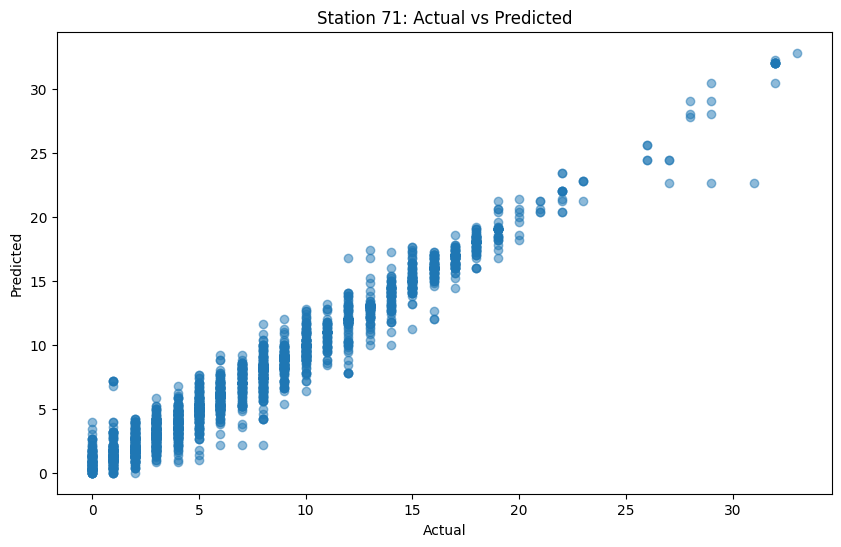

--------------------------------------------------
Number of predictions for station 72: 2893
R^2 Score: 0.9163553706814546
Accuracy: 0.5458002073971656


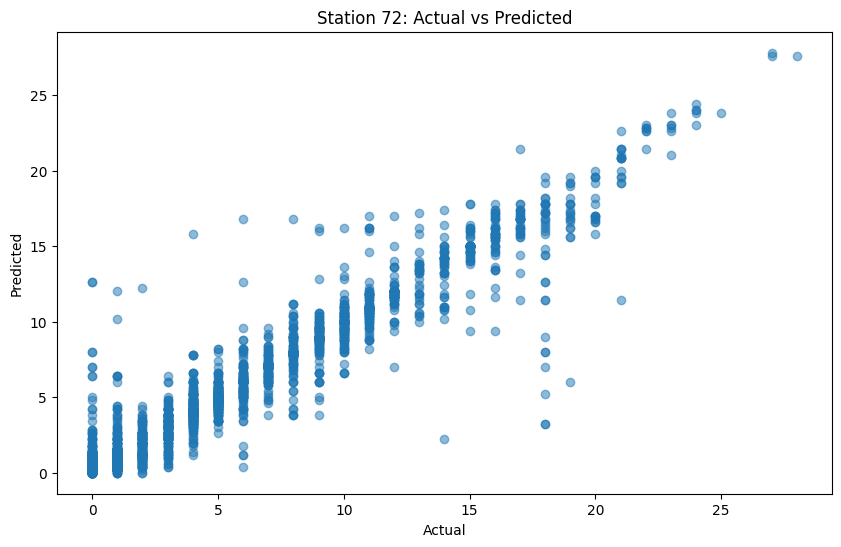

--------------------------------------------------
Number of predictions for station 73: 3011
R^2 Score: 0.9505014038227103
Accuracy: 0.48090335436731985


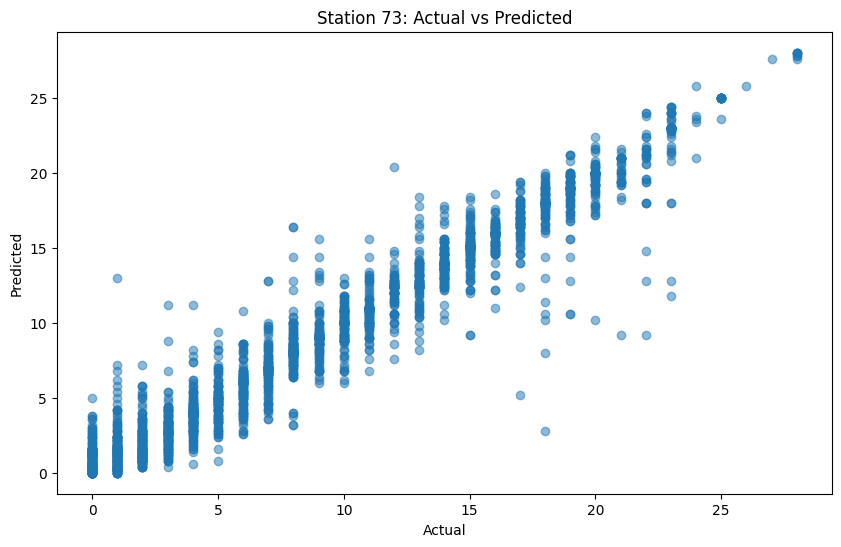

--------------------------------------------------
Number of predictions for station 74: 2895
R^2 Score: 0.9706196622276815
Accuracy: 0.566839378238342


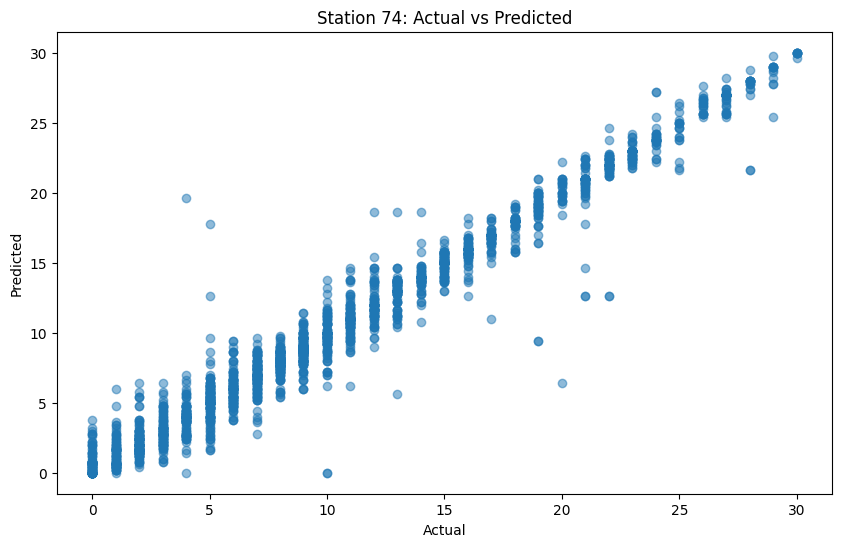

--------------------------------------------------
Number of predictions for station 75: 2946
R^2 Score: 0.9536224059711452
Accuracy: 0.5689069925322471


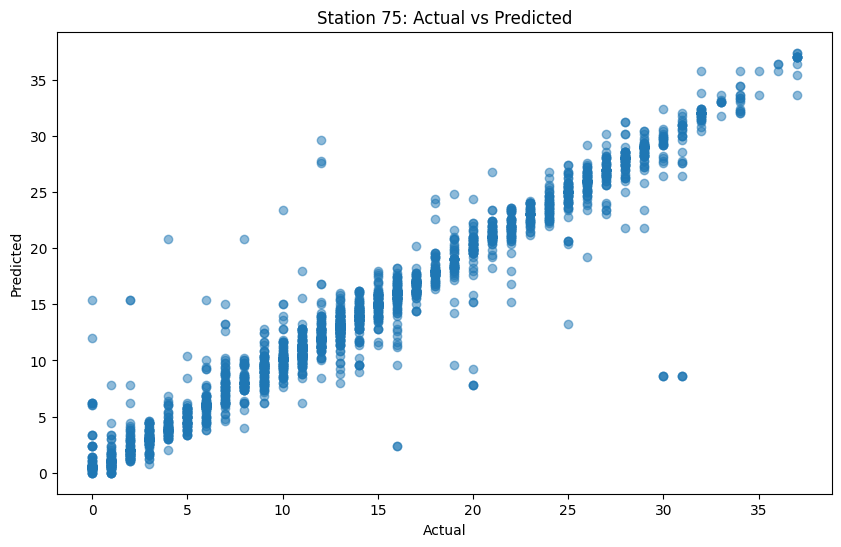

--------------------------------------------------
Number of predictions for station 76: 2759
R^2 Score: 0.9466606124524803
Accuracy: 0.5741210583544762


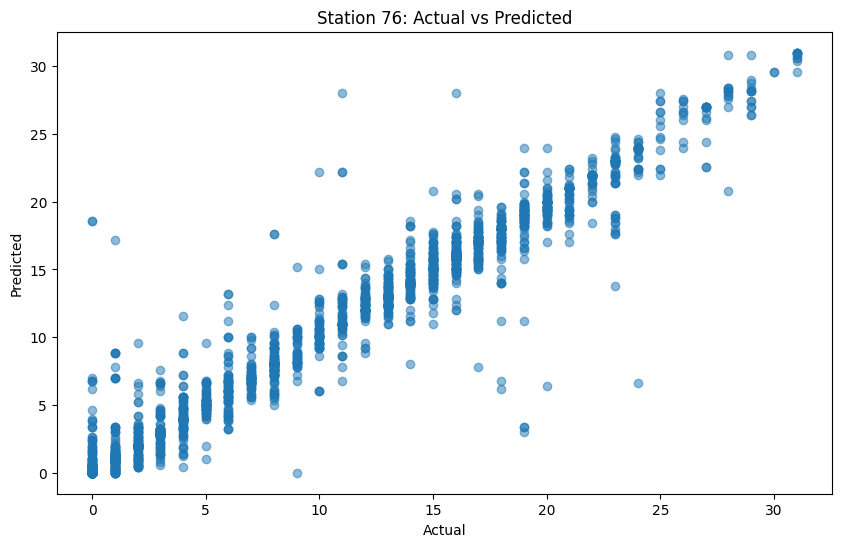

--------------------------------------------------
Number of predictions for station 77: 3029
R^2 Score: 0.975532956745683
Accuracy: 0.5057774843182569


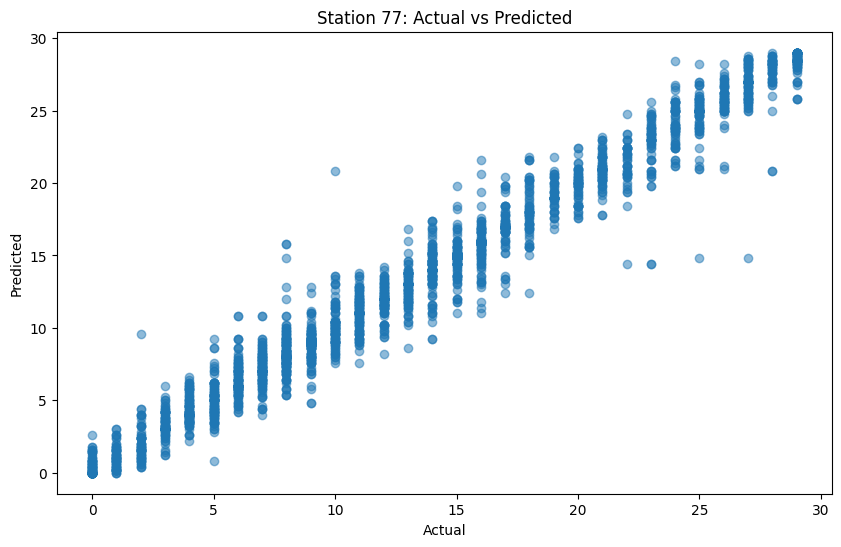

--------------------------------------------------
Number of predictions for station 78: 2865
R^2 Score: 0.9703720851366466
Accuracy: 0.5738219895287958


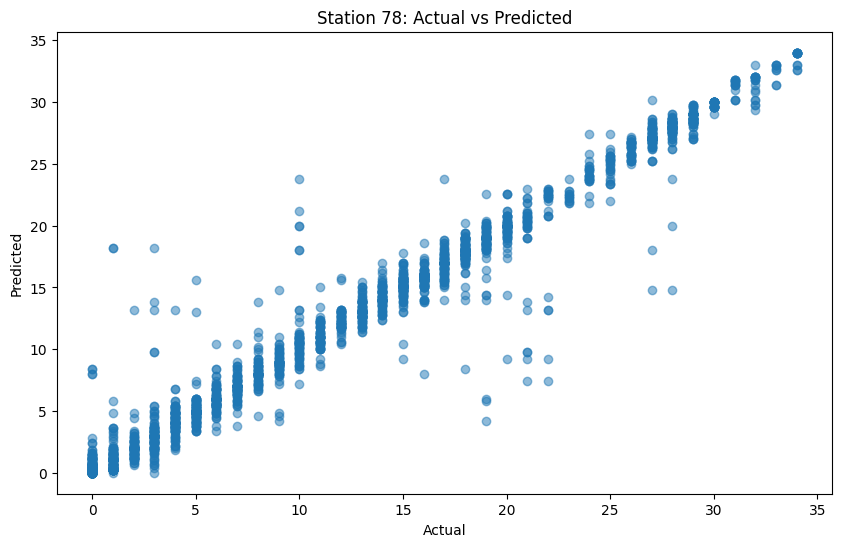

--------------------------------------------------
Number of predictions for station 79: 2629
R^2 Score: 0.9372867152725595
Accuracy: 0.7535184480791175


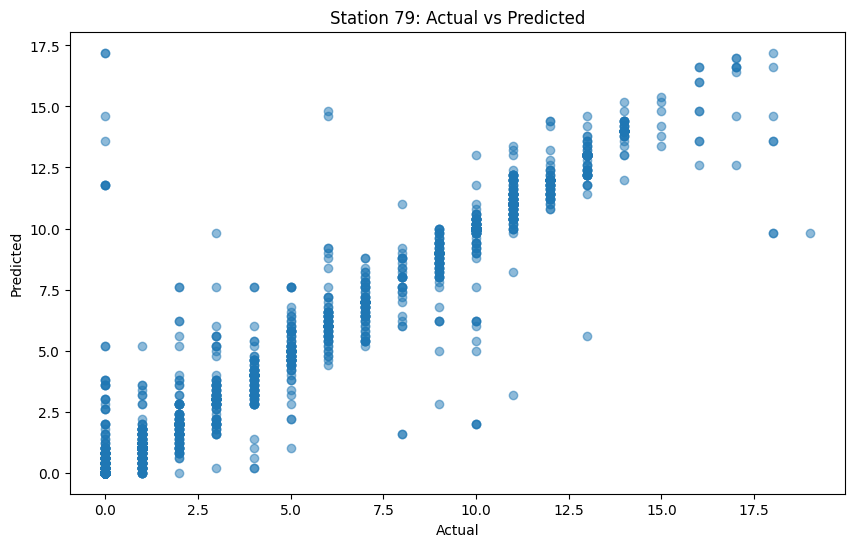

--------------------------------------------------
Number of predictions for station 80: 2863
R^2 Score: 0.9583883498443274
Accuracy: 0.6280125742228432


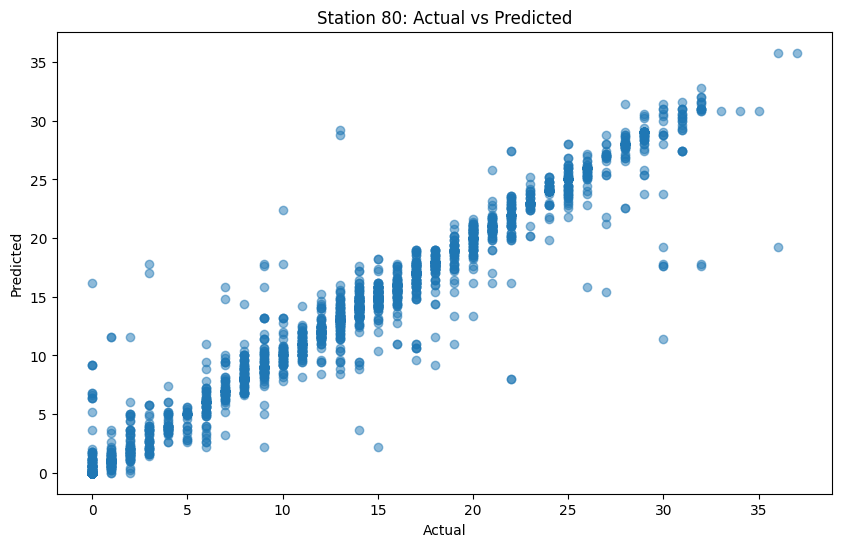

--------------------------------------------------
Number of predictions for station 82: 2653
R^2 Score: 0.9845775731586544
Accuracy: 0.7274783264229174


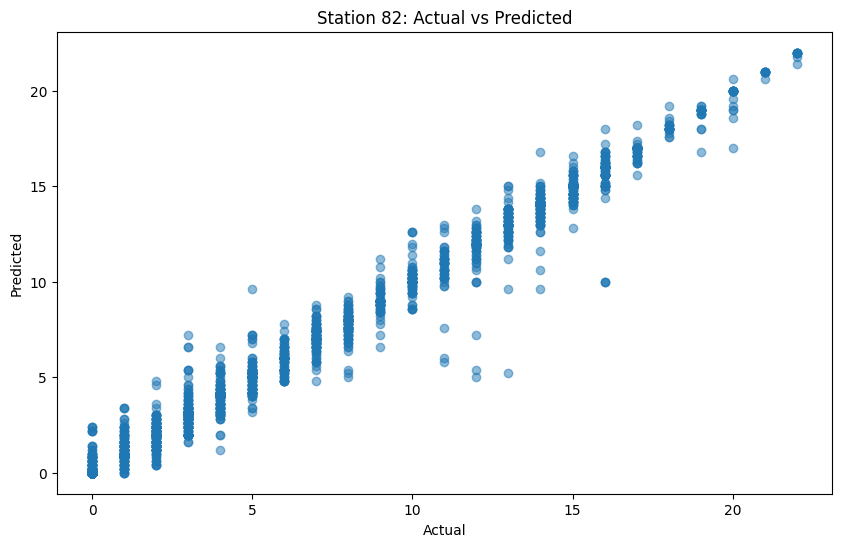

--------------------------------------------------
Number of predictions for station 83: 2880
R^2 Score: 0.9789250499983088
Accuracy: 0.5743055555555555


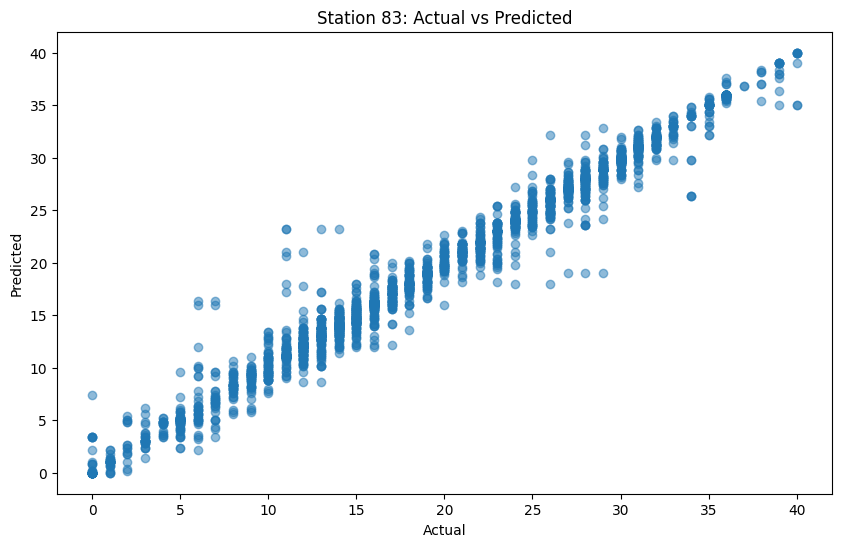

--------------------------------------------------
Number of predictions for station 84: 2748
R^2 Score: 0.9810997655979998
Accuracy: 0.6692139737991266


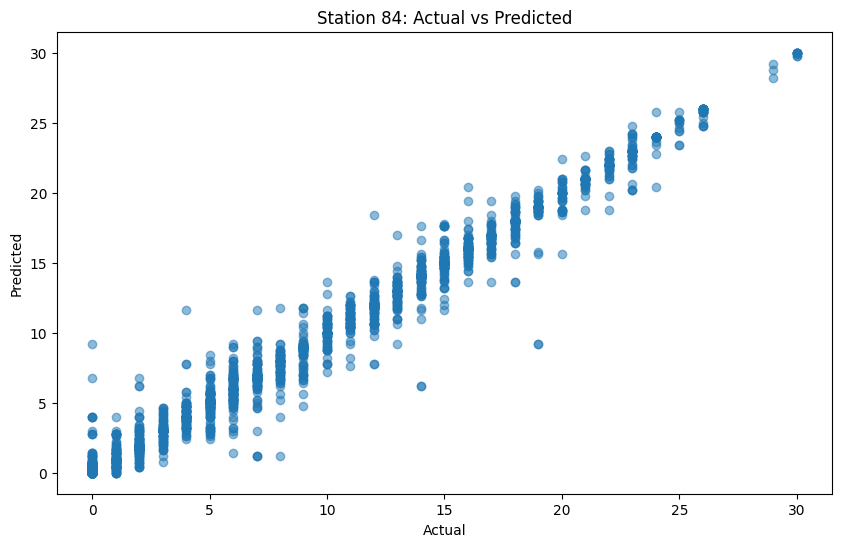

--------------------------------------------------
Number of predictions for station 85: 2811
R^2 Score: 0.9650808379167937
Accuracy: 0.6133048737104233


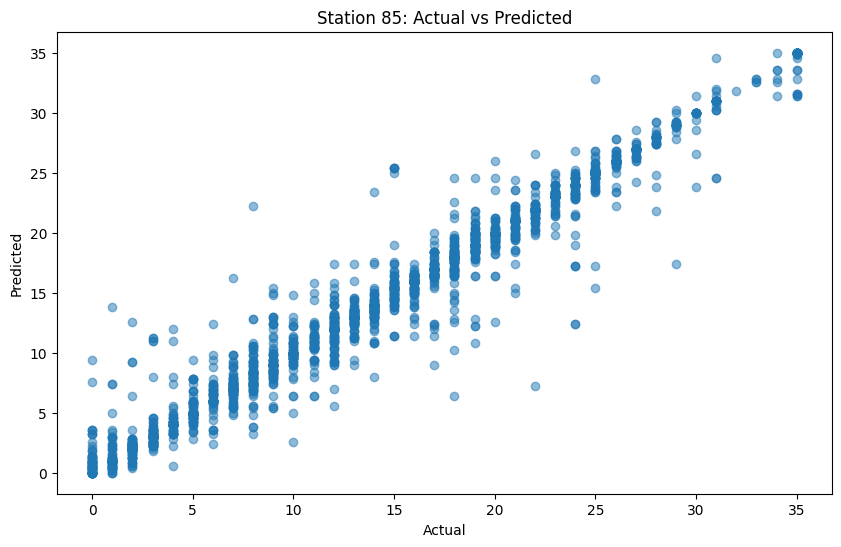

--------------------------------------------------
Number of predictions for station 86: 3013
R^2 Score: 0.9704363010011958
Accuracy: 0.5190839694656488


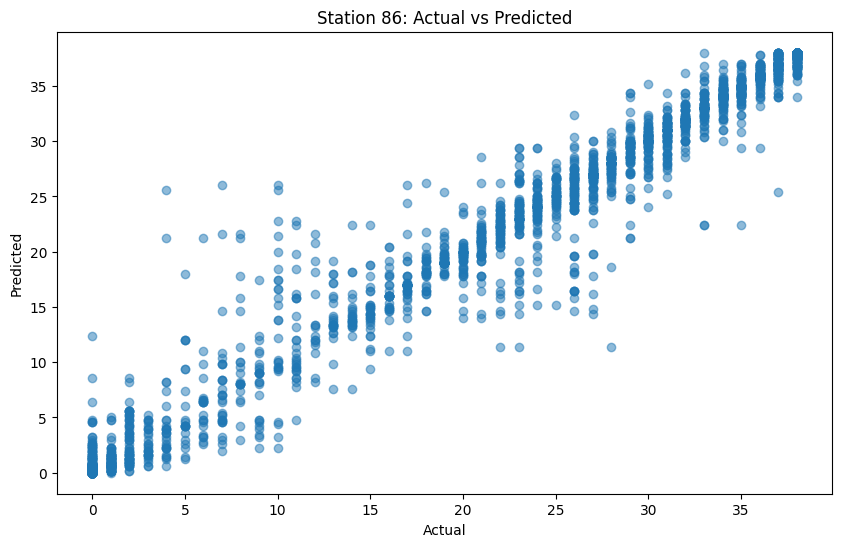

--------------------------------------------------
Number of predictions for station 87: 2837
R^2 Score: 0.9842004369373943
Accuracy: 0.5953471977440958


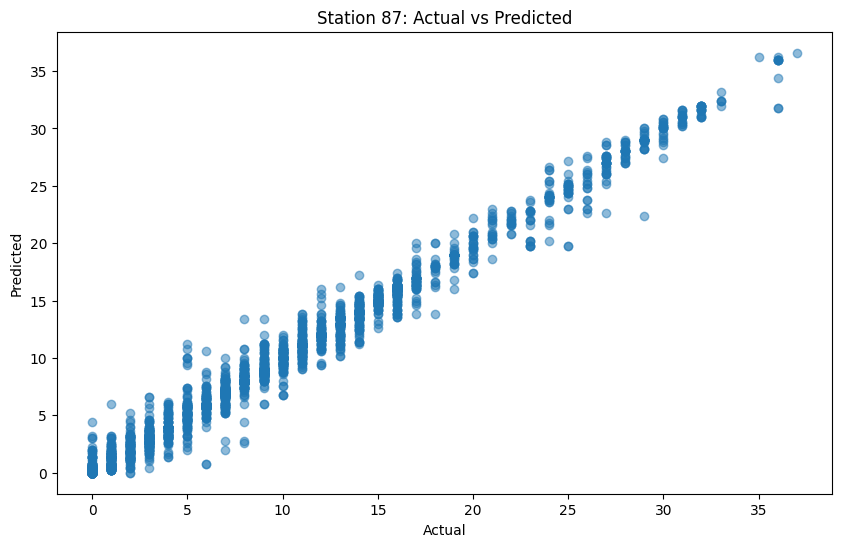

--------------------------------------------------
Number of predictions for station 88: 2897
R^2 Score: 0.9757101294693318
Accuracy: 0.5550569554711771


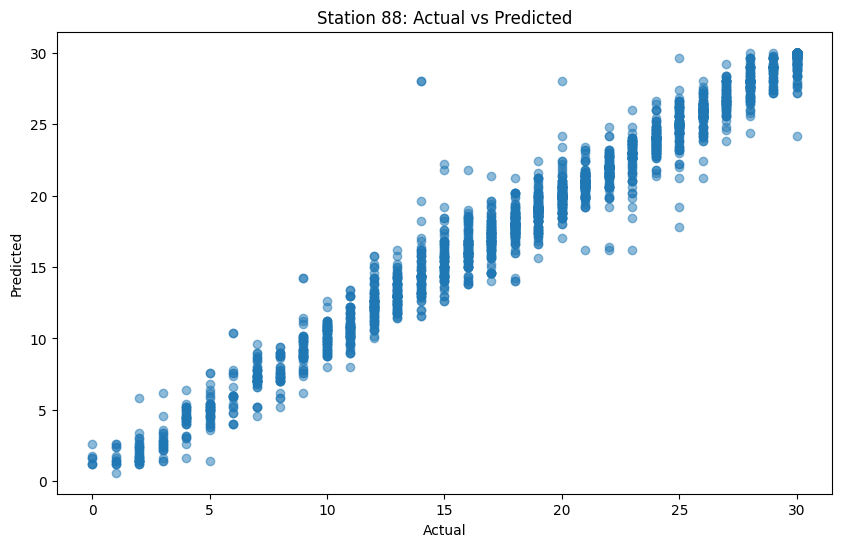

--------------------------------------------------
Number of predictions for station 89: 2686
R^2 Score: 0.9650100775116931
Accuracy: 0.7535368577810871


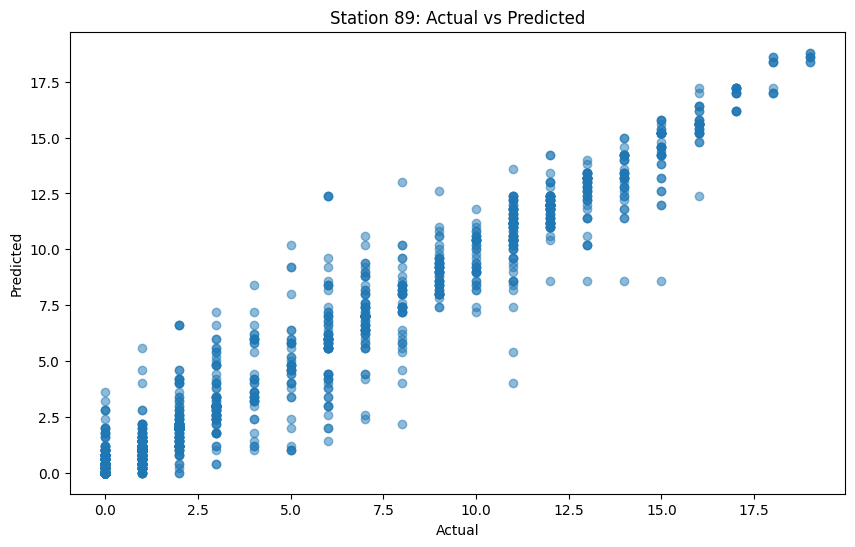

--------------------------------------------------
Number of predictions for station 90: 3094
R^2 Score: 0.961305043845914
Accuracy: 0.4819004524886878


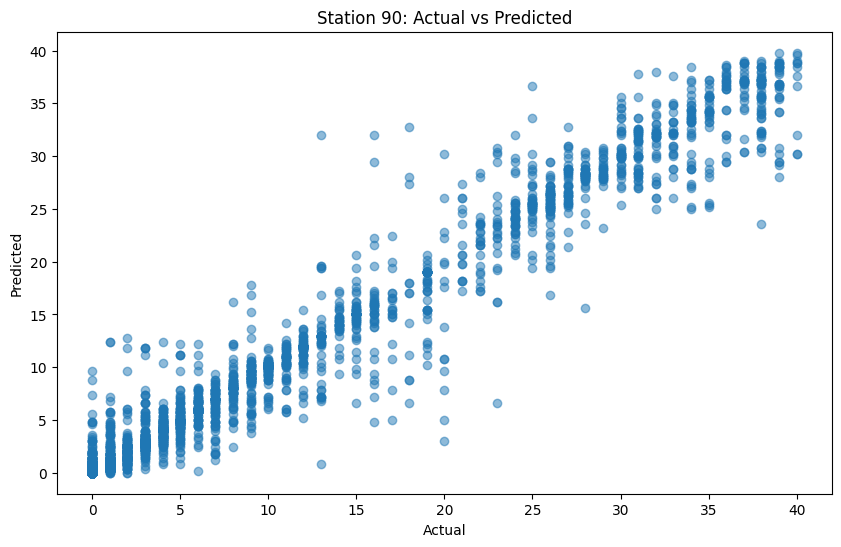

--------------------------------------------------
Number of predictions for station 91: 3218
R^2 Score: 0.9452096337069523
Accuracy: 0.44623990055935364


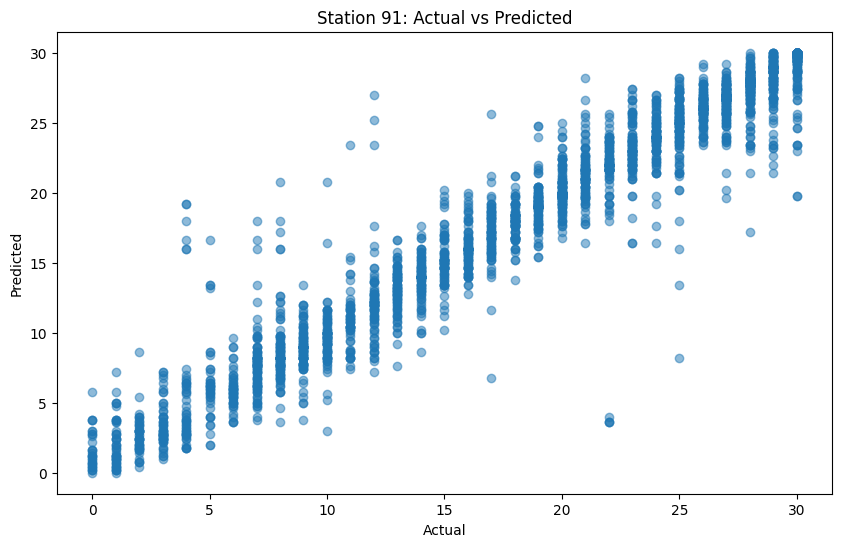

--------------------------------------------------
Number of predictions for station 92: 2928
R^2 Score: 0.9723964303488204
Accuracy: 0.5850409836065574


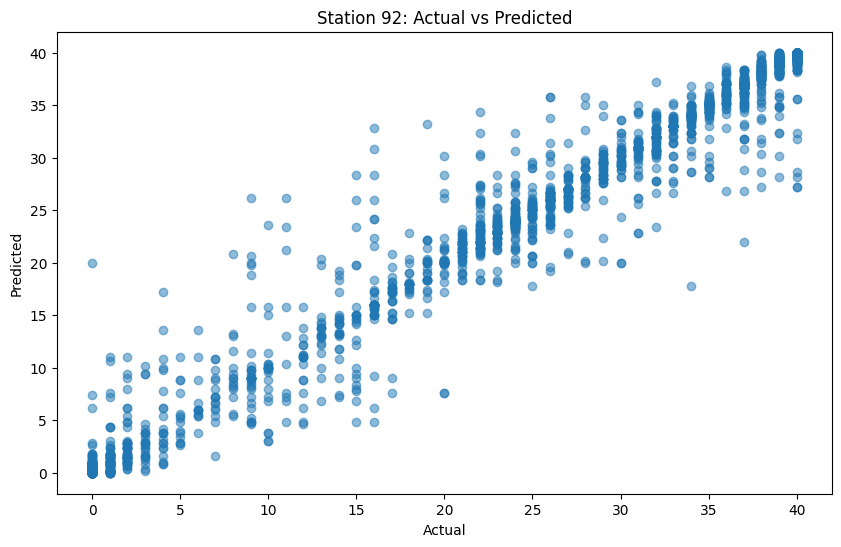

--------------------------------------------------
Number of predictions for station 93: 2713
R^2 Score: 0.9649449501218389
Accuracy: 0.7917434574272023


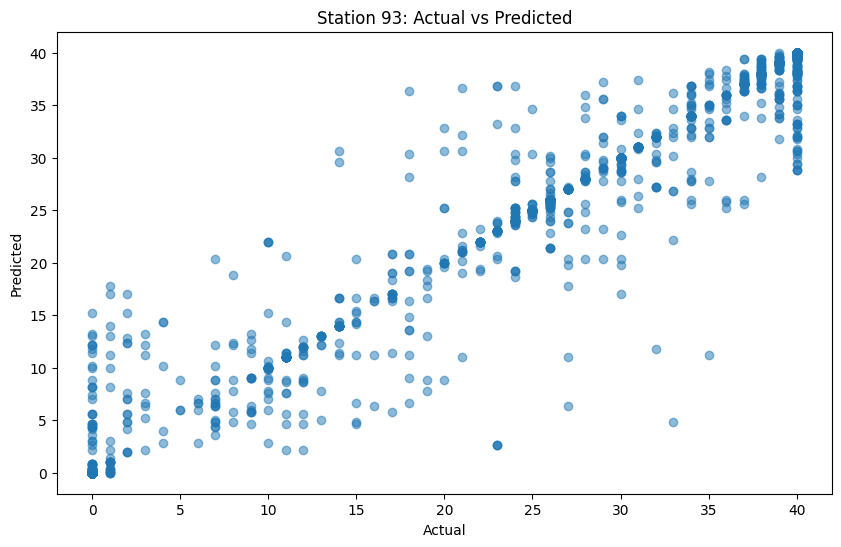

--------------------------------------------------
Number of predictions for station 94: 2676
R^2 Score: 0.9834607259082693
Accuracy: 0.8467862481315396


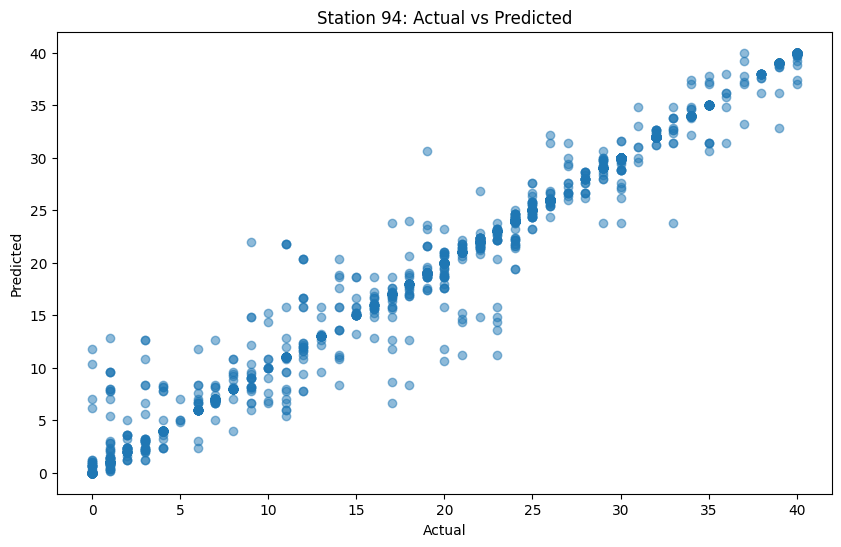

--------------------------------------------------
Number of predictions for station 95: 2975
R^2 Score: 0.9774042500376322
Accuracy: 0.5314285714285715


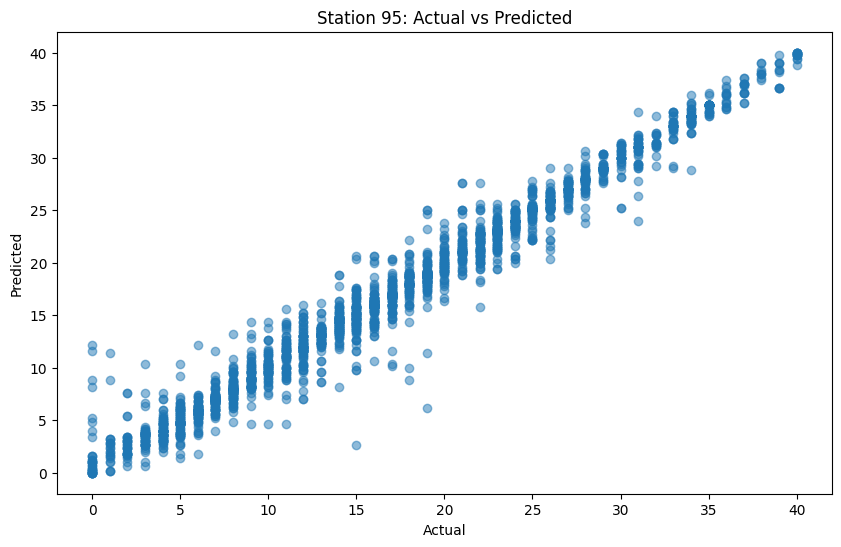

--------------------------------------------------
Number of predictions for station 96: 2582
R^2 Score: 0.9764333703103538
Accuracy: 0.7683965917893106


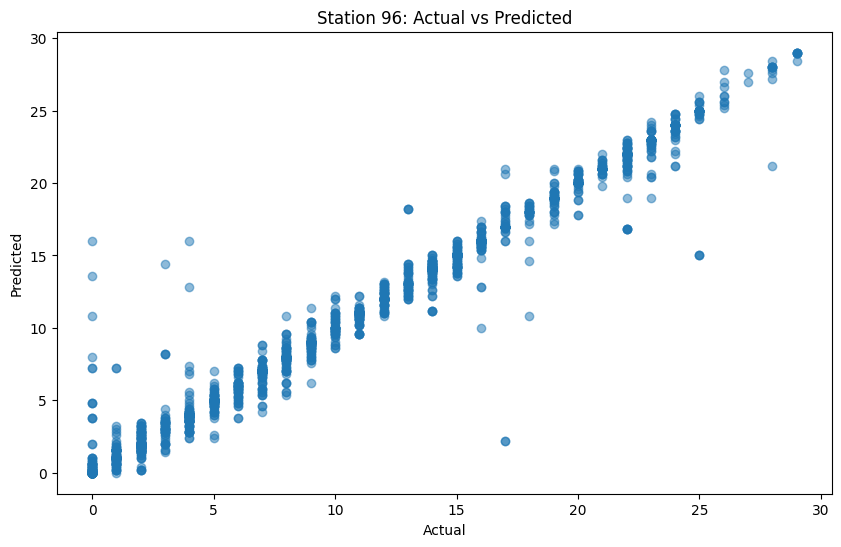

--------------------------------------------------
Number of predictions for station 97: 2892
R^2 Score: 0.9608547808816977
Accuracy: 0.5491009681881052


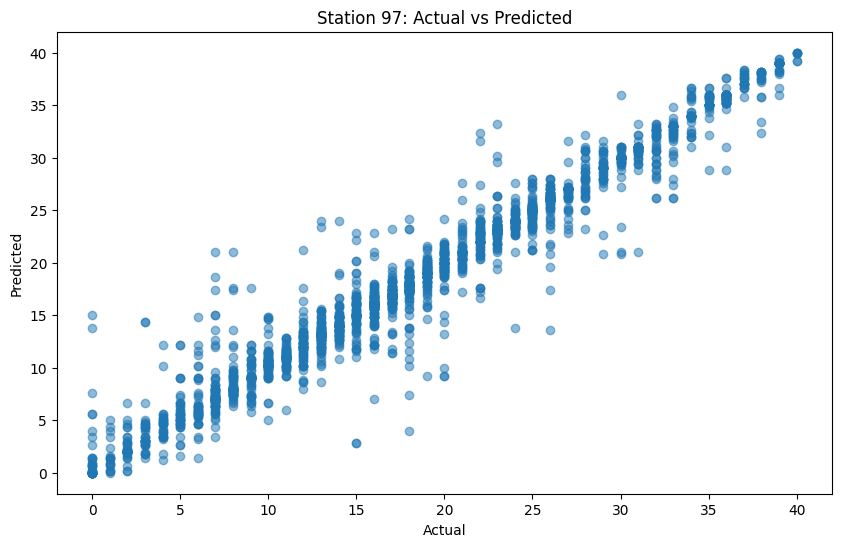

--------------------------------------------------
Number of predictions for station 98: 2821
R^2 Score: 0.9854101910580834
Accuracy: 0.6168025522864232


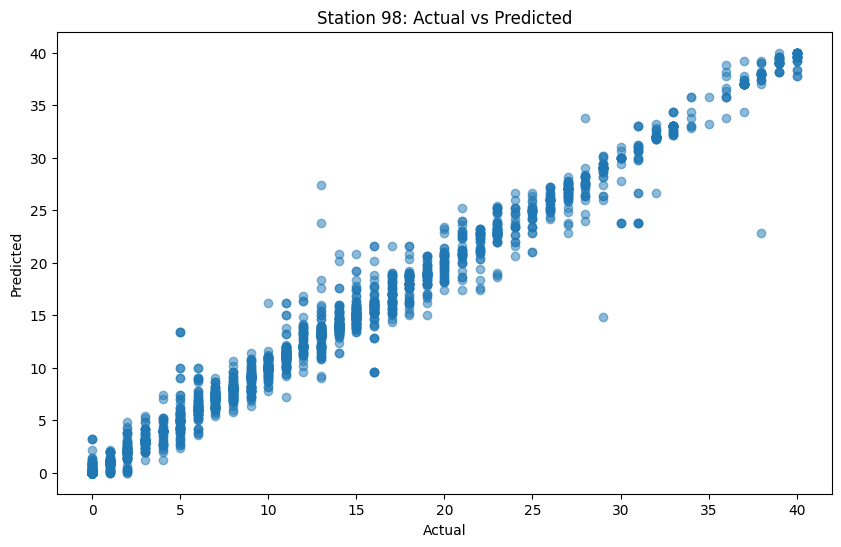

--------------------------------------------------
Number of predictions for station 99: 2828
R^2 Score: 0.9787108196984384
Accuracy: 0.6092644978783592


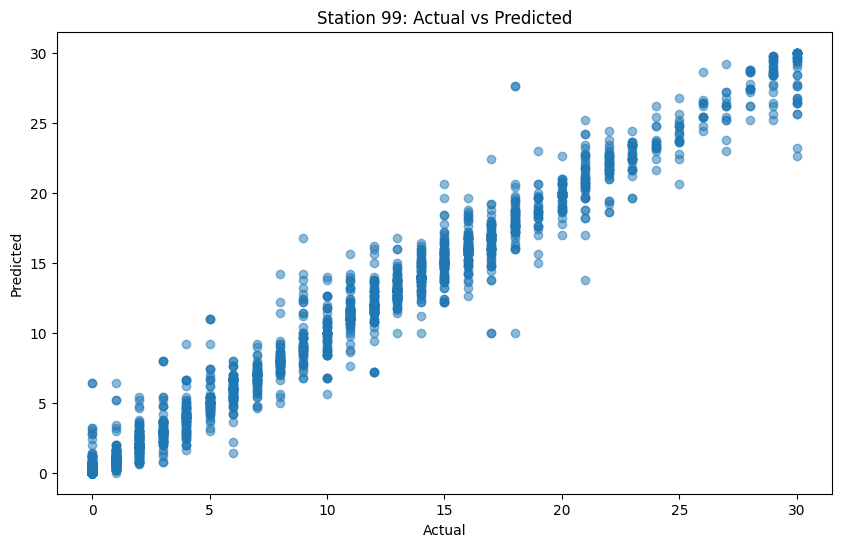

--------------------------------------------------
Number of predictions for station 100: 2975
R^2 Score: 0.9408614376551848
Accuracy: 0.5431932773109244


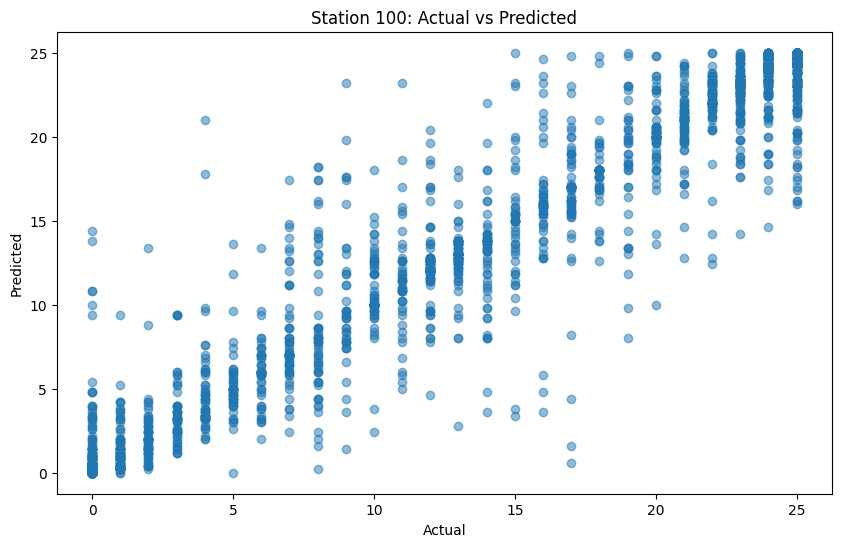

--------------------------------------------------
Number of predictions for station 101: 2891
R^2 Score: 0.9748650240287371
Accuracy: 0.5230024213075061


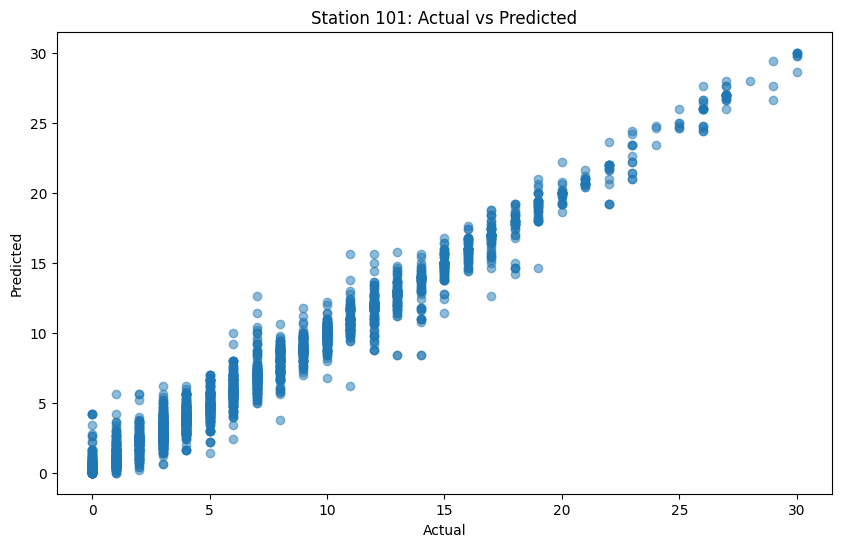

--------------------------------------------------
Number of predictions for station 102: 2732
R^2 Score: 0.9423589967773439
Accuracy: 0.6259150805270863


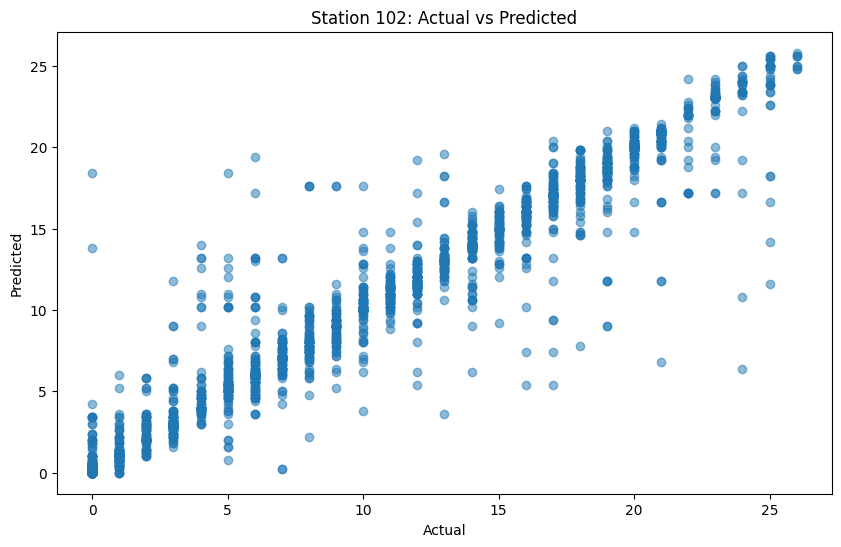

--------------------------------------------------
Number of predictions for station 103: 2730
R^2 Score: 0.9661014729961364
Accuracy: 0.6798534798534799


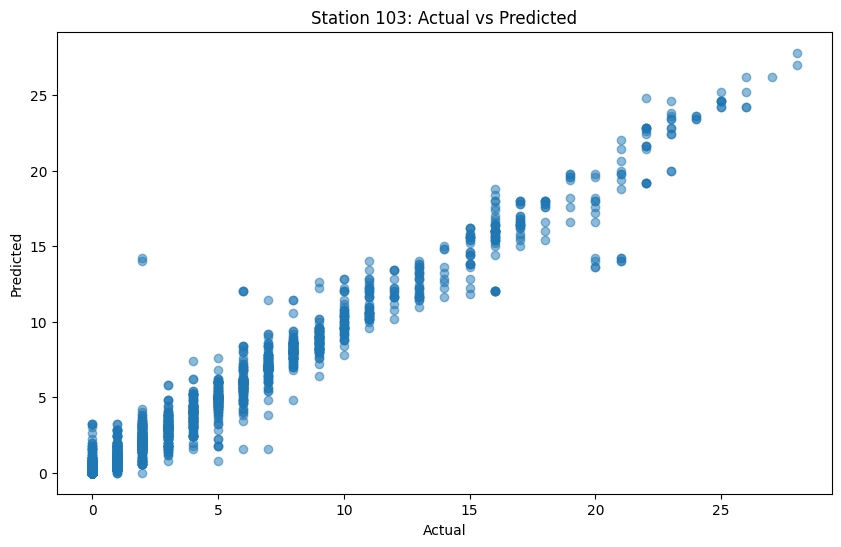

--------------------------------------------------
Number of predictions for station 104: 2602
R^2 Score: 0.9724247707924851
Accuracy: 0.8408916218293621


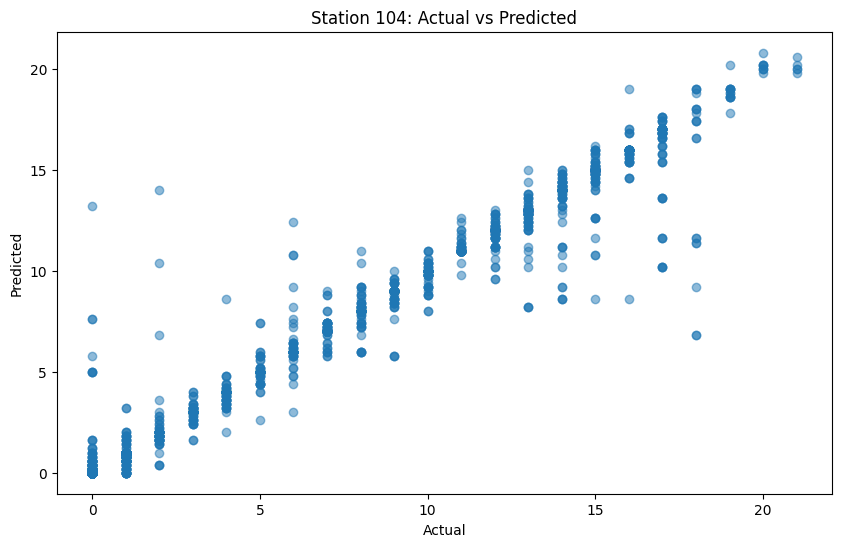

--------------------------------------------------
Number of predictions for station 105: 2670
R^2 Score: 0.9649187925651158
Accuracy: 0.7524344569288389


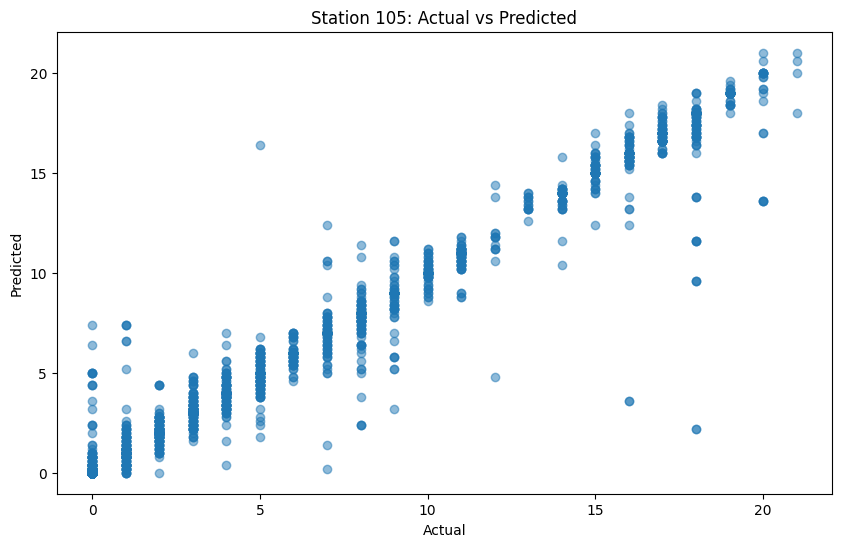

--------------------------------------------------
Number of predictions for station 106: 2724
R^2 Score: 0.9376470285524129
Accuracy: 0.6288546255506607


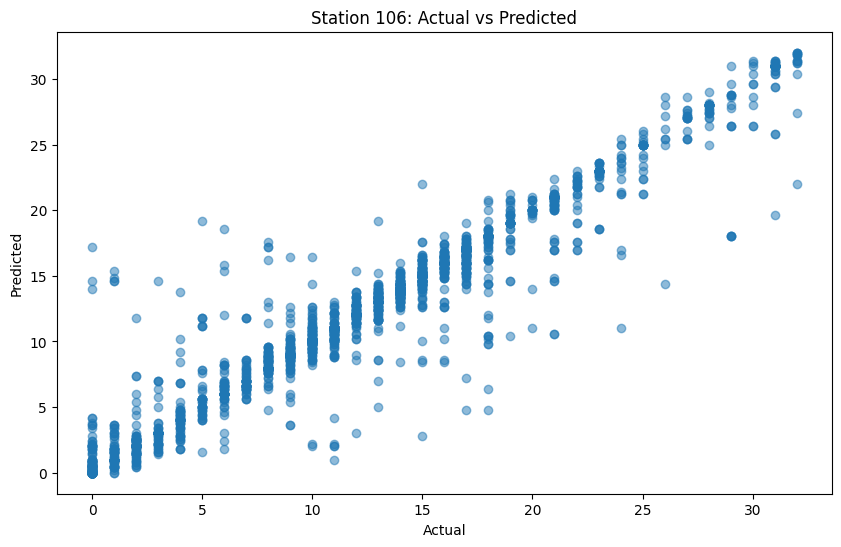

--------------------------------------------------
Number of predictions for station 107: 2812
R^2 Score: 0.9598310187600364
Accuracy: 0.5981507823613087


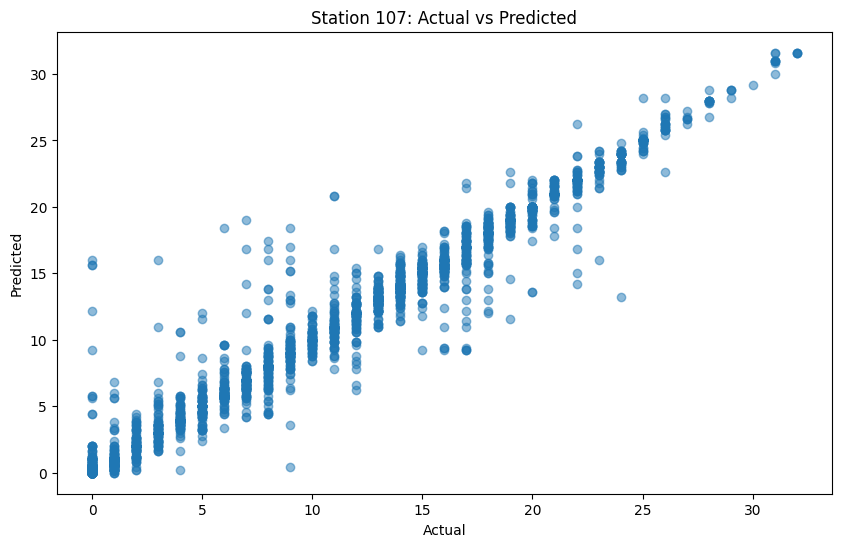

--------------------------------------------------
Number of predictions for station 108: 2825
R^2 Score: 0.9448522340772691
Accuracy: 0.5936283185840708


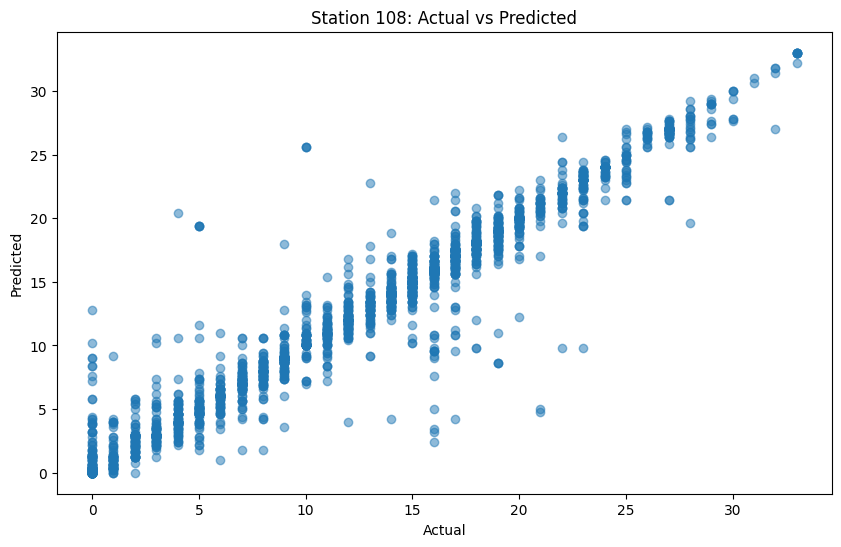

--------------------------------------------------
Number of predictions for station 109: 2909
R^2 Score: 0.9820496732984345
Accuracy: 0.568236507390856


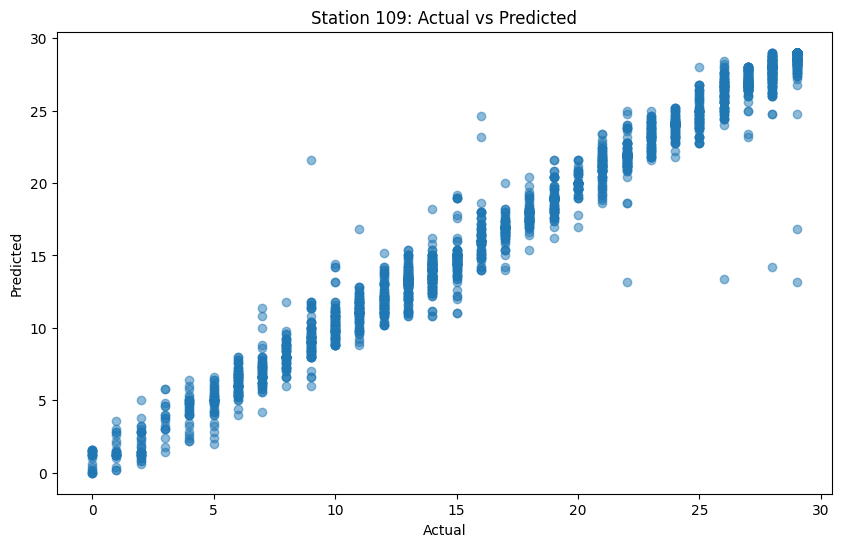

--------------------------------------------------
Number of predictions for station 110: 2783
R^2 Score: 0.9567341318213969
Accuracy: 0.6410348544735897


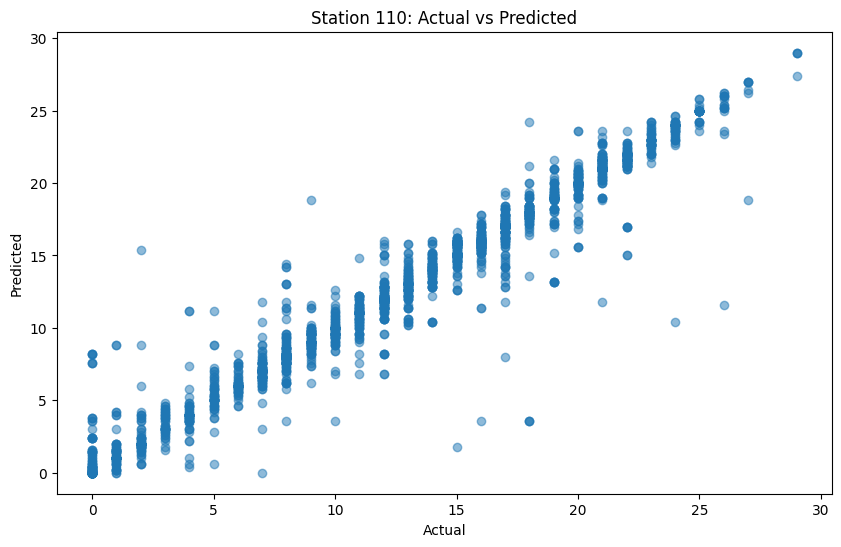

--------------------------------------------------
Number of predictions for station 111: 2868
R^2 Score: 0.9604722826940071
Accuracy: 0.5648535564853556


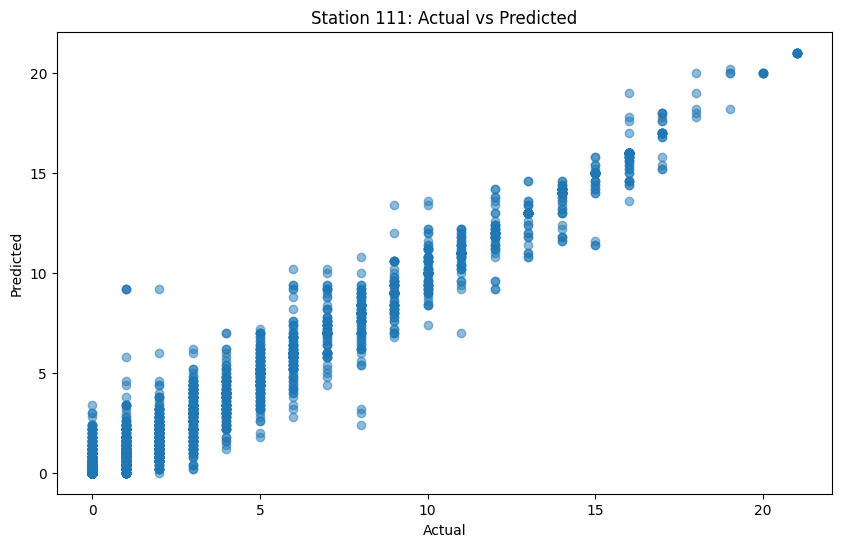

--------------------------------------------------
Number of predictions for station 112: 3107
R^2 Score: 0.9665149671245785
Accuracy: 0.43611200514966203


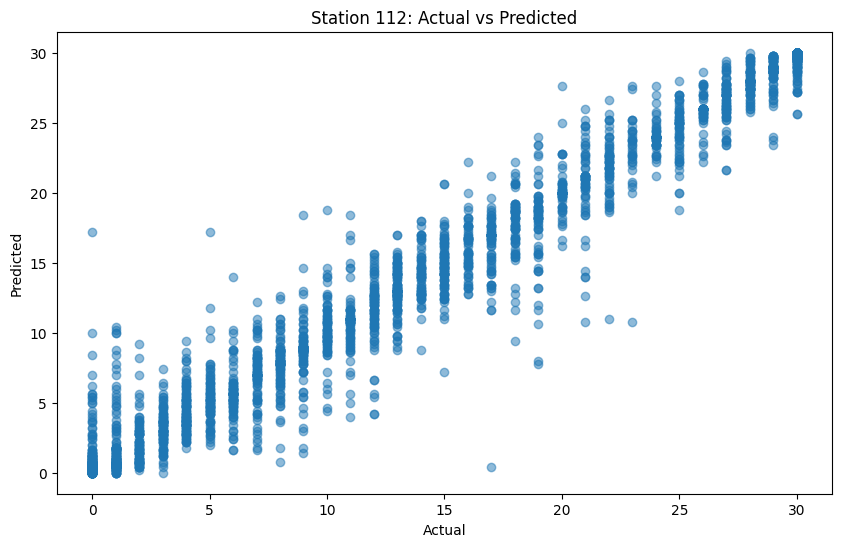

--------------------------------------------------
Number of predictions for station 113: 2636
R^2 Score: 0.9870586640565332
Accuracy: 0.7598634294385432


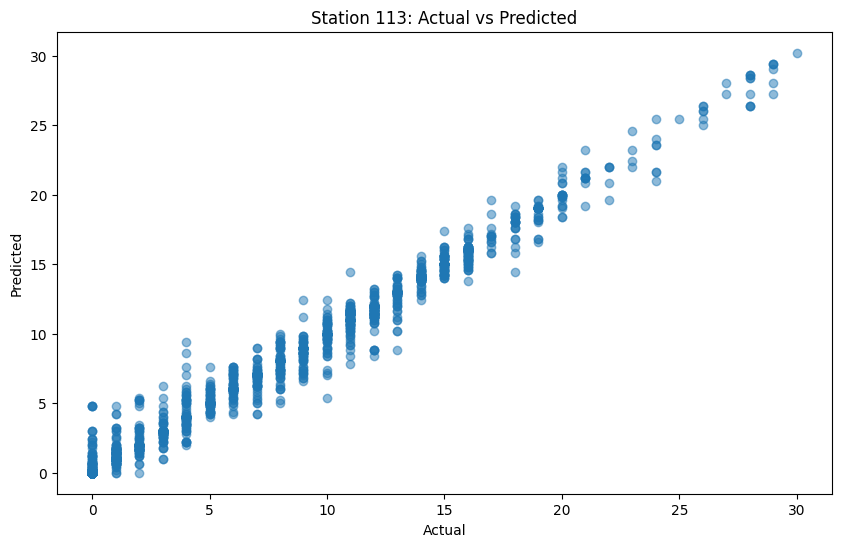

--------------------------------------------------
Number of predictions for station 114: 3023
R^2 Score: 0.9648218343773134
Accuracy: 0.5011577902745616


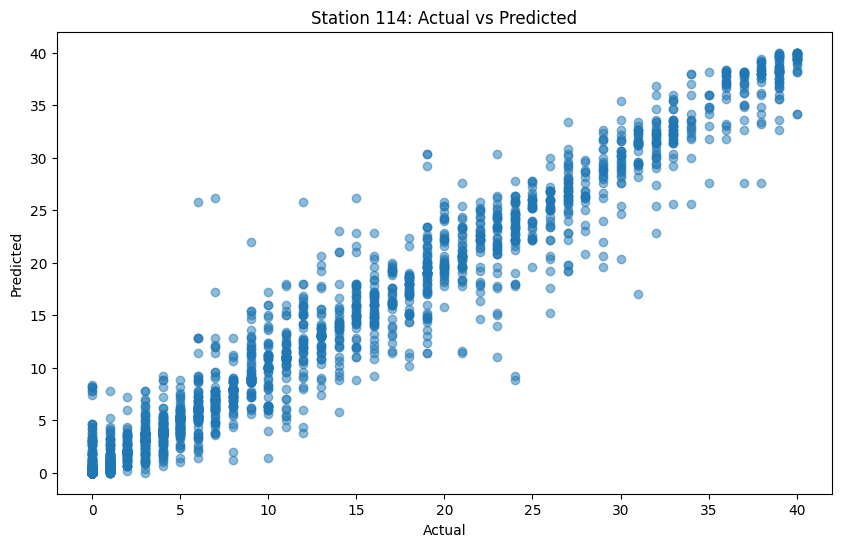

--------------------------------------------------
Number of predictions for station 115: 3175
R^2 Score: 0.9728922886829251
Accuracy: 0.49196850393700786


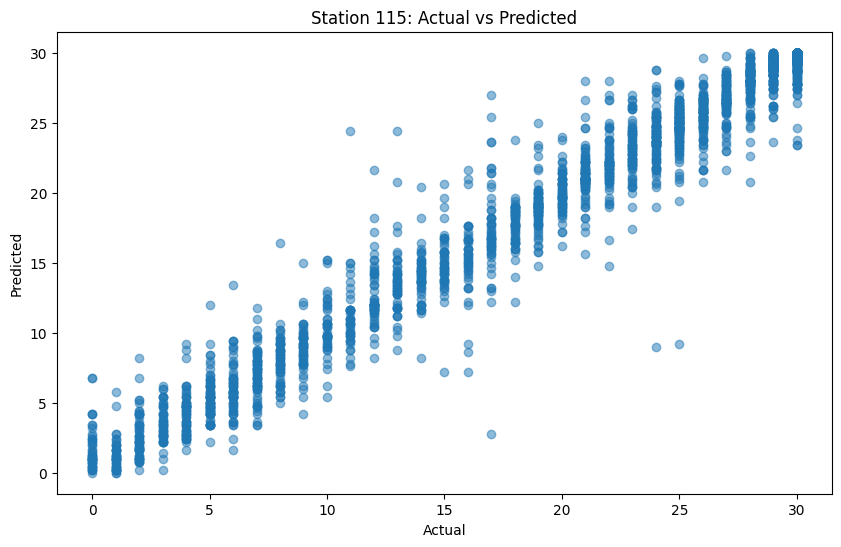

--------------------------------------------------
Number of predictions for station 116: 2592
R^2 Score: 0.9681652495018341
Accuracy: 0.7314814814814815


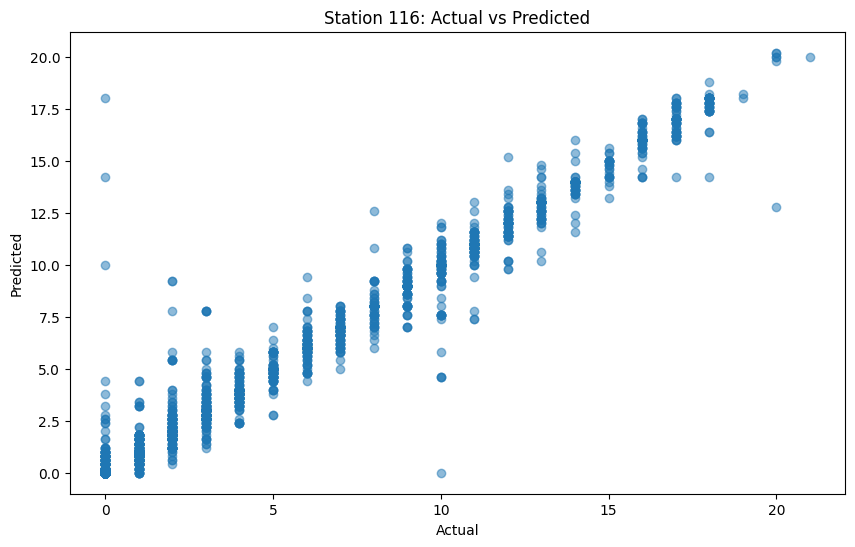

--------------------------------------------------
Number of predictions for station 117: 2725
R^2 Score: 0.9799566198006899
Accuracy: 0.6634862385321101


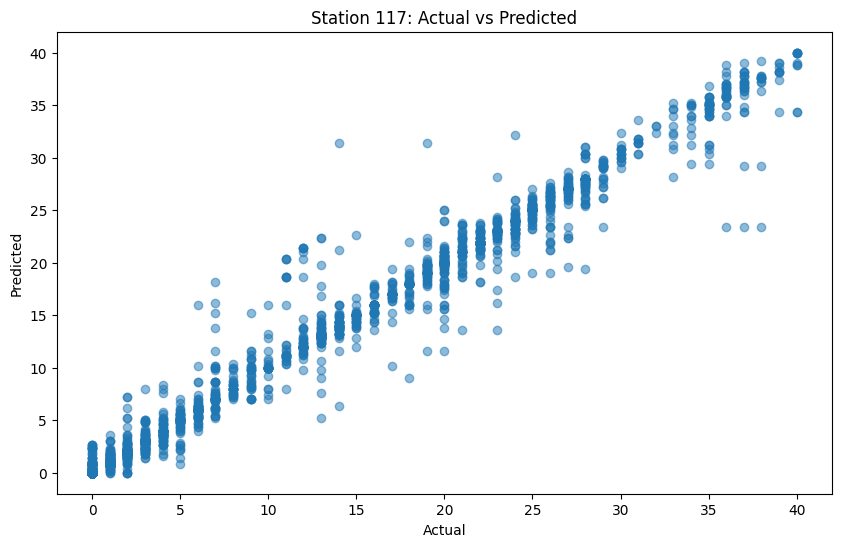

--------------------------------------------------
Average accuracy: 0.5598981139971607
Worst accuracy: 0.3420095158130423
Best accuracy: 0.8467862481315396
10 worst stations: [69, 33, 34, 58, 5, 19, 66, 9, 60, 14]
10 best stations: [94, 104, 93, 96, 53, 113, 89, 79, 105, 37]


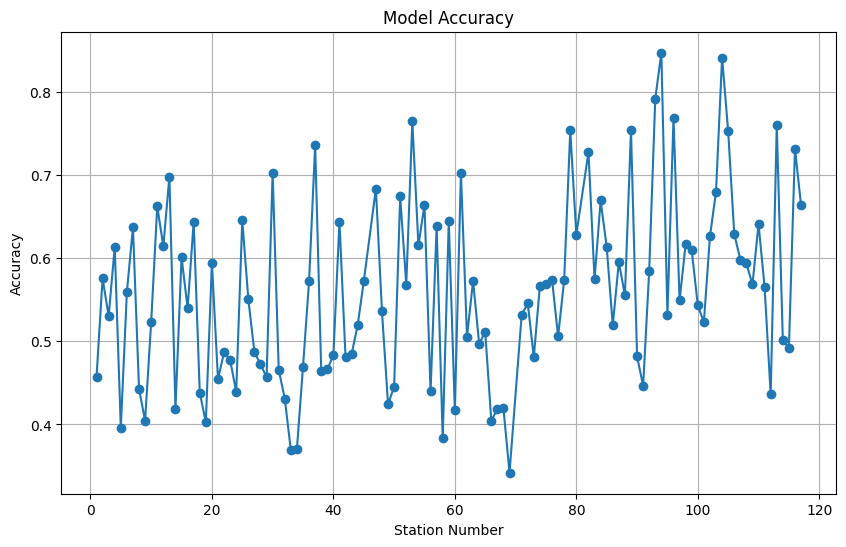

In [9]:
stations = df["number"].unique()

models = {}
if not os.path.exists("models_availability"):
    os.makedirs("models_availability")


"""
Effectively, we are giving the model the following information:
temp
feels_like	
wind_speed	
humidity		
year	
month	
day	
hour	
minute	
day_of_week
"""
acc_dict = {}
for station in stations:
    df_station = df[df["number"] == station]

    X = df_station.drop(
        [
            "time",
            "date",
            "available_bikes",
            "number",
            "available_bike_stands",
            "lon",
            "lat",
            "id",
            "weather_description",
            "curr_time",
            "last_update",
        ],
        axis=1,
    )
    y = df_station["available_bikes"]

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

    # Train a KNN model
    model = KNeighborsRegressor()
    model.fit(X_train, y_train)

    # Store the model in the dictionary
    models[station] = model

    # Serialize model
    dump(model, f"models_availability/model_availability{station}.joblib")

    # Make predictions on the testing data
    y_pred = model.predict(X_test)
    print(f"Number of predictions for station {station}: {len(y_pred)}")

    # Evaluate the model
    r2_score = model.score(X_test, y_test)
    print(f"R^2 Score: {r2_score}")
    y_pred_rounded = np.round(y_pred)

    accuracy = accuracy_score(y_test, y_pred_rounded)
    acc_dict[station] = accuracy
    print(f"Accuracy: {accuracy}")

    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.xlabel("Actual")
    plt.ylabel("Predicted")
    plt.title(f"Station {station}: Actual vs Predicted")
    plt.show()
    print("--------------------------------------------------")

acc_sum = sum(acc_dict.values())
acc_avg = acc_sum / len(acc_dict)
print(f"Average accuracy: {acc_avg}")
print(f"Worst accuracy: {min(acc_dict.values())}")
print(f"Best accuracy: {max(acc_dict.values())}")
lowest_10 = sorted(acc_dict, key=acc_dict.get)[:10]
print(f"10 worst stations: {lowest_10}")
highest_10 = sorted(acc_dict, key=acc_dict.get, reverse=True)[:10]
print(f"10 best stations: {highest_10}")

stations = list(acc_dict.keys())
accuracies = list(acc_dict.values())

plt.figure(figsize=(10, 6))
plt.plot(stations, accuracies, marker="o")
plt.title("Model Accuracy")
plt.xlabel("Station Number")
plt.ylabel("Accuracy")
plt.grid(True)
plt.show()